In [2]:
import sys
print(sys.path)
sys.path.append('/home/zinovyev/anaconda3/lib/python3.7/site-packages')
sys.path.append('/home/zinovyev/anaconda3/lib/python3.7/site-packages/skdim/')
sys.path.append('/mnt/c/MyPrograms/__github/Stabilized_ICA')
sys.path.append('/mnt/c/MyPrograms/__github/scycle')
print(sys.path)

['/mnt/c/Datas/SingleCellTranscriptomics/RNAVelocity', '/usr/lib/python37.zip', '/usr/lib/python3.7', '/usr/lib/python3.7/lib-dynload', '', '/home/zinovyev/.local/lib/python3.7/site-packages', '/usr/local/lib/python3.7/dist-packages', '/usr/lib/python3/dist-packages', '/home/zinovyev/.local/lib/python3.7/site-packages/IPython/extensions', '/home/zinovyev/.ipython']
['/mnt/c/Datas/SingleCellTranscriptomics/RNAVelocity', '/usr/lib/python37.zip', '/usr/lib/python3.7', '/usr/lib/python3.7/lib-dynload', '', '/home/zinovyev/.local/lib/python3.7/site-packages', '/usr/local/lib/python3.7/dist-packages', '/usr/lib/python3/dist-packages', '/home/zinovyev/.local/lib/python3.7/site-packages/IPython/extensions', '/home/zinovyev/.ipython', '/home/zinovyev/anaconda3/lib/python3.7/site-packages', '/home/zinovyev/anaconda3/lib/python3.7/site-packages/skdim/', '/mnt/c/MyPrograms/__github/Stabilized_ICA', '/mnt/c/MyPrograms/__github/scycle']


In [3]:
import loompy
import numpy as np
import pandas as pd
import scvelo as sv
import anndata
import scanpy as sc
import time
import skdim
import matplotlib as mpl
import matplotlib.pyplot as plt
from sklearn.kernel_ridge import KernelRidge
from sklearn.gaussian_process.kernels import RBF, ConstantKernel as C
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.metrics import r2_score
from algorithms.stabilized_ICA import StabilizedICA
from elpigraph_ps_tools import *
from sklearn.decomposition import PCA
from scipy.stats.mstats import winsorize
import scycle as cc
import os
from os import listdir
from os.path import isfile, join

from sklearn.neighbors import NearestNeighbors

from scipy.stats import hypergeom

def find_enriched_components(adata,refset,plot=False,mlog10pval_threshold=10):
    scores = []
    reference_set = list(set(refset)&set(adata.uns['scycle']['dimRed']['features']))
    S_matrix = adata.varm['P_dimRed']
    for i in range(S_matrix.shape[1]):
        toppgenes = adata.uns['scycle']['dimRed']['features'][np.where(S_matrix[:,i]>3)[0]]
        inters = list(set(toppgenes)&set(reference_set))
        x = len(inters)
        M = S_matrix.shape[0]
        n = len(reference_set)
        N = len(toppgenes)
        prb = hypergeom.cdf(x, M, n, N)
        score = -np.log10(1-prb+1e-20)
        scores.append(score)
    inds = np.where(np.array(scores)>mlog10pval_threshold)[0]
    if plot:
        plt.plot(scores,'bo-')
        plt.xlabel('Components')
        plt.ylabel('-log10pvalue')
        plt.plot([0,S_matrix.shape[1]],[mlog10pval_threshold,mlog10pval_threshold],'r--')
        plt.show()
    return inds

def compute_IC_scores(adata,threshold=3.0):
    signature_dict = {}
    for i in range(adata.varm['P_dimRed'].shape[1]):
        genes = adata.uns['scycle']['dimRed']['features'][adata.varm['P_dimRed'][:,i]>threshold]
        signature_dict['IC'+str(i+1)] = genes
    sc.pp.highly_variable_genes(adata,n_top_genes=2001,n_bins=20)
    ind_genes2k = np.where(adata.var['highly_variable'])[0]
    adata2k = adata[:,ind_genes2k]
    scores_dic = calc_scores(adata2k,signature_dict)
    for score in scores_dic:
        adata.obs[score] = scores_dic[score]
        
def get_relevant_components(adata,reference_geneset,mlog10pval_threshold=10):
    inds = find_enriched_components(adata,reference_geneset,mlog10pval_threshold=mlog10pval_threshold)
    list_of_comps = ['IC'+str(i+1) for i in inds]
    return list_of_comps

def get_cell_cycle_subspace(adata,threshold=3):
    list_of_dims = ['S-phase','G2-M']
    if adata.uns['scycle']['enrich_components']['G2M-_score']>thresh:
        list_of_dims.append('G2-M-')
    if adata.uns['scycle']['enrich_components']['Histone_score']>thresh:
        list_of_dims.append('Histone_IC')
    return list_of_dims


def calc_scores(anndata,signature_dict):
    matrix = anndata.to_df().to_numpy()
    scores_dic = {}
    for key in signature_dict:
        names = np.array(signature_dict[key])
        inds = np.where(np.isin(anndata.var_names,names))[0]
        matrix_sel = matrix[:,inds]
        scores = np.mean(matrix_sel,axis=1)
        scores_dic[key] = scores
    return scores_dic

def renormalize_matrix_by_partition(gexp, partition):
    prt = partition
    npart = np.max(prt)+1
    new_gexp = np.empty(gexp.shape)
    for p in range(npart):
        sidx = np.where(partition == p)[0] # sample index
        totals = np.sum(gexp[sidx,:], axis = 1) # total counts per sample in group
        median = np.median(totals) # median counts for samples in group
        #mn = np.mean(totals)
        if median>0:
            new_gexp[sidx,:] = gexp[sidx,:] / totals[:,None] * median
        else:
            print('median for ',p,' is zero!')
            new_gexp[sidx,:] = gexp[sidx,:]
        #new_gexp[sidx,:] = gexp[sidx,:] / totals[:,None] * mn
    return new_gexp
    

def renormalize_by_partition_simplified(adata, partition, verbose = True):
    old_totals = adata.obs['total_counts']
    adata.X = renormalize_matrix_by_partition(adata.X, partition)
    if 'matrix' in adata.layers:
        adata.layers['matrix'] = renormalize_matrix_by_partition(_get_nd_array(adata.layers['matrix']),partition)
    if 'spliced' in adata.layers:
        adata.layers['spliced'] = renormalize_matrix_by_partition(_get_nd_array(adata.layers['spliced']),partition)
    if 'unspliced' in adata.layers:
        adata.layers['unspliced'] = renormalize_matrix_by_partition(_get_nd_array(adata.layers['unspliced']),partition)
    adata.obs['total_counts'] = np.sum(adata.X, axis = 1)
    adata.obs['total_counts_raw'] = old_totals

def compute_ica(adata_k,DrawProfiles=False,reuseICAresults=False):
    if not reuseICAresults:
        cc.tl.dimensionality_reduction(adata_k,method='ica')
        cc.tl.enrich_components(adata_k,thr=0.0)
        S_matrix = adata_k.uns['dimRed'].S_
    else:
        S_matrix = adata_k.varm['P_dimRed'].T
    
    #idx_g1s = adata_k.uns['scycle']['enrich_components']['G1/S']
    idx_g1s = adata_k.uns['scycle']['enrich_components']['G1S']
    adata_k.uns['S-phase_genes'] = list(adata_k.var_names[S_matrix[idx_g1s,:]>3])
    #idx_g2m = adata_k.uns['scycle']['enrich_components']['G2M+']
    idx_g2m = adata_k.uns['scycle']['enrich_components']['G2M+']
    adata_k.uns['G2-M_genes'] = list(adata_k.var_names[S_matrix[idx_g2m,:]>3])
    #idx_g2m_inh = adata_k.uns['scycle']['enrich_components']['G2/M-']
    idx_g2m_inh = adata_k.uns['scycle']['enrich_components']['G2M-']
    adata_k.uns['G2-M_INH_genes'] = list(adata_k.var_names[S_matrix[idx_g2m_inh,:]>3])
    idx_histone = adata_k.uns['scycle']['enrich_components']['Histone']
    adata_k.uns['Histone_IC_genes'] = list(adata_k.var_names[S_matrix[idx_histone,:]>3])
    
    signature_dict = {'S-phase':adata_k.uns['S-phase_genes'],
                      'G2-M':adata_k.uns['G2-M_genes'],
                      'G2-M-':adata_k.uns['G2-M_INH_genes'],
                      'Histone_IC':adata_k.uns['Histone_IC_genes']}  
 
    sc.pp.highly_variable_genes(adata_k,n_top_genes=2001,n_bins=20)
    ind_genes2k = np.where(adata_k.var['highly_variable'])[0]
    adata2k = adata_k[:,ind_genes2k]
    scores_dic = calc_scores(adata2k,signature_dict)
    for score in scores_dic:
        adata_k.obs[score] = scores_dic[score]
        
    sc.pl.scatter(adata_k,x='S-phase',y='G2-M',color='total_counts')
    
    adata_k.varm['P_dimRed'] = S_matrix.T
    adata_k.uns['dimRed'] = None
    
def compute_self_consistent_principal_circle(adata,
                                             max_number_of_iterations=10,
                                            eps_jaccard = 0.01,
                                            number_of_pc_components = 30,
                                             number_of_nodes = 30,
                                             r2_threshold = 0.5, Mu=0.1):
    
    Xtemp = adata.X
    cc.tl.subtract_cc(adata)
    adata.X = Xtemp
    r2scores = adata.var['r2_scores']
    ind = np.where(r2scores>r2_threshold)[0]
    print('Cell cycle genes initially found:',len(ind))
    print('Top ones:',list(adata.var_names[np.where(r2scores>0.95)[0]]))    
    
    ind_old = ind
    for counter in range(max_number_of_iterations):
        Xcc = adata.X[:,ind]
        pca = PCA(n_components=np.min((number_of_pc_components,len(ind)-1)))
        Xcc_reduced = pca.fit_transform(Xcc)
        mn = np.mean(Xcc,axis=0)
        u = Xcc_reduced
        v = pca.components_.T
        Xr = Xcc_reduced.astype(np.float64)
        
        egr = elpigraph.computeElasticPrincipalCircle(Xr,number_of_nodes,Mu=Mu)
        
        nodep = egr[0]['NodePositions']
        edges = egr[0]['Edges'][0]
        partition, dists = elpigraph.src.core.PartitionData(X = Xr, NodePositions = nodep, 
                                                        MaxBlockSize = 100000000, TrimmingRadius = np.inf,
                                                        SquaredX = np.sum(Xr**2,axis=1,keepdims=1))        
        adata.obs['partition'] = partition
        Xtemp = adata.X
        cc.tl.subtract_cc(adata)
        adata.X = Xtemp
        r2scores_sc = adata.var['r2_scores']
        
        ind = np.where(r2scores_sc>r2_threshold)[0]
        idx_common_genes = list(set(ind)&set(ind_old))
        union_genes = list(set(ind)|set(ind_old))
        perc = len(idx_common_genes)/len(union_genes)
        print('\n\nIteration',counter+1,'==================\nJaccard coeff:',perc,'Old:',len(ind_old),'New:',len(ind),'\n==================\n')
        if perc>1-eps_jaccard:
            break
        ind_old = ind.copy()
        
    print('Cell cycle genes found from the self-consistent trajectory:',len(ind))
    print('Top ones:',list(adata.var_names[np.where(r2scores>0.9)[0]]))
    adata.uns['cc_genes'] = list(adata.var_names[ind])

    
import numpy as np

import matplotlib.pyplot as plt
from matplotlib.patches import Circle, RegularPolygon
from matplotlib.path import Path
from matplotlib.projections.polar import PolarAxes
from matplotlib.projections import register_projection
from matplotlib.spines import Spine
from matplotlib.transforms import Affine2D
import os.path
from os import path



def radar_factory(num_vars, frame='circle'):
    """
    Create a radar chart with `num_vars` axes.

    This function creates a RadarAxes projection and registers it.

    Parameters
    ----------
    num_vars : int
        Number of variables for radar chart.
    frame : {'circle', 'polygon'}
        Shape of frame surrounding axes.

    """
    # calculate evenly-spaced axis angles
    theta = np.linspace(0, 2*np.pi, num_vars, endpoint=False)

    class RadarAxes(PolarAxes):

        name = 'radar'
        # use 1 line segment to connect specified points
        RESOLUTION = 1

        def __init__(self, *args, **kwargs):
            super().__init__(*args, **kwargs)
            # rotate plot such that the first axis is at the top
            self.set_theta_zero_location('N')

        def fill(self, *args, closed=True, **kwargs):
            """Override fill so that line is closed by default"""
            return super().fill(closed=closed, *args, **kwargs)

        def plot(self, *args, **kwargs):
            """Override plot so that line is closed by default"""
            lines = super().plot(*args, **kwargs)
            for line in lines:
                self._close_line(line)

        def _close_line(self, line):
            x, y = line.get_data()
            # FIXME: markers at x[0], y[0] get doubled-up
            if x[0] != x[-1]:
                x = np.append(x, x[0])
                y = np.append(y, y[0])
                line.set_data(x, y)

        def set_varlabels(self, labels):
            self.set_thetagrids(np.degrees(theta), labels)

        def _gen_axes_patch(self):
            # The Axes patch must be centered at (0.5, 0.5) and of radius 0.5
            # in axes coordinates.
            if frame == 'circle':
                return Circle((0.5, 0.5), 0.5)
            elif frame == 'polygon':
                return RegularPolygon((0.5, 0.5), num_vars,
                                      radius=.5, edgecolor="k")
            else:
                raise ValueError("Unknown value for 'frame': %s" % frame)

        def _gen_axes_spines(self):
            if frame == 'circle':
                return super()._gen_axes_spines()
            elif frame == 'polygon':
                # spine_type must be 'left'/'right'/'top'/'bottom'/'circle'.
                spine = Spine(axes=self,
                              spine_type='circle',
                              path=Path.unit_regular_polygon(num_vars))
                # unit_regular_polygon gives a polygon of radius 1 centered at
                # (0, 0) but we want a polygon of radius 0.5 centered at (0.5,
                # 0.5) in axes coordinates.
                spine.set_transform(Affine2D().scale(.5).translate(.5, .5)
                                    + self.transAxes)
                return {'polar': spine}
            else:
                raise ValueError("Unknown value for 'frame': %s" % frame)

    register_projection(RadarAxes)
    return theta

def compute_principal_curve_from_circle(X,n_nodes=30,Mu=0.1,Lambda=0.01, produceTree=False):
    egr = elpigraph.computeElasticPrincipalCircle(X,int(n_nodes/2),Mu=Mu)
    nodep = egr[0]['NodePositions']
    edges = egr[0]['Edges'][0]
    partition, dists = elpigraph.src.core.PartitionData(X = X, NodePositions = nodep, 
                                                            MaxBlockSize = 100000000, TrimmingRadius = np.inf,
                                                            SquaredX = np.sum(X**2,axis=1,keepdims=1))
    node_sizes = np.array([len(np.where(partition==i)[0]) for i in range(nodep.shape[0])])
    node_min = np.argmin(node_sizes)
    edges_open = edges.copy()
    k = 0
    starting_node = -1
    while k<edges_open.shape[0]:
        e = edges_open[k,:]
        if (e[0]==node_min)|(e[1]==node_min):
            edges_open = np.delete(edges_open,k,axis=0)
            if e[0]==node_min:
                starting_node = e[1]
        else:
            k = k+1
    nodep_open = np.delete(nodep,node_min,axis=0)
    if starting_node>node_min:
        starting_node = starting_node-1
    for e in edges_open:
        if e[0]>node_min:
            e[0]=e[0]-1
        if e[1]>node_min:
            e[1]=e[1]-1
    if produceTree:
        egrl = elpigraph.computeElasticPrincipalTree(X,n_nodes,InitNodePositions=nodep_open,
                                                 InitEdges=edges_open,Lambda=Lambda,Mu=Mu,
                                                 alpha=0.01,FinalEnergy='Penalized')
    else:
        egrl = elpigraph.computeElasticPrincipalCurve(X,n_nodes,InitNodePositions=nodep_open,
                                                 InitEdges=edges_open,Lambda=Lambda,Mu=Mu,
                                                 alpha=0.01,FinalEnergy='Penalized')
    return egrl, starting_node

from scipy.interpolate import UnivariateSpline
from scipy.signal import find_peaks


def calc_curvature(nodep,smoothing_factor=10):
    splines = []
    derivs = []
    for i in range(nodep.shape[1]):
        xv = np.linspace(0,nodep.shape[0]-1,nodep.shape[0])
        yv = nodep[:,i]
        #xv = np.array([-1]+list(xv)+[xv[-1]+1])
        #yv = np.array([2*yv[0]-yv[1]]+list(yv)+[2*yv[-1]-yv[-2]])
        #plt.plot(xv,yv,'-o')
        spline = UnivariateSpline(xv,yv,s=0,k=3)
        splines.append(spline)
        derivs.append(spline.derivative(n=2))
    n_points = nodep.shape[0]
    curv = np.zeros(nodep.shape[0])
    x = np.linspace(0,nodep.shape[0]-1,n_points)
    temp = np.zeros((n_points,nodep.shape[1]))
    print(temp.shape)
    for i in range(len(derivs)):
        temp[:,i] = derivs[i](x)
    curv = np.sqrt(np.sum(temp**2,axis=1))
    curv_spl = UnivariateSpline(x,curv,s=np.var(curv)*smoothing_factor,k=3)
    return x, curv_spl(x), splines

def find_nonproliferative_cells(adata,estimation_fraction_nonproliferating_cells=0.3, 
                                number_of_nodes=-1,max_number_of_iterations = 20,
                               number_of_sigmas=3.0,Mu=1.0):
    all_markers = list(adata.uns['S-phase_genes'])+list(adata.uns['G2-M_genes'])
    Xccm = adata[:,list(set(all_markers)&set(adata.var_names))].X
    cc_score = np.array(list(np.mean(Xccm,axis=1)))

    ind_sorted_prolif = np.argsort(cc_score)
    ind_nonprolif = ind_sorted_prolif[0:int(len(adata)*estimation_fraction_nonproliferating_cells)]
    adata.obs['proliferating'] = np.empty(len(adata)).astype(np.bool)
    adata.obs['proliferating'][:] = True
    adata.obs['proliferating'][ind_nonprolif] = False
    
    sc.pl.scatter(adata,x='S-phase',y='G2-M',color='proliferating')

    fraction_nonprolif_old = estimation_fraction_nonproliferating_cells

    for i in range(max_number_of_iterations):
        X_elpigraph_training = adata.obs[['S-phase','G2-M']].to_numpy().astype(np.float64)
        u = X_elpigraph_training.copy()
        X_elpigraph_training = X_elpigraph_training[adata.obs['proliferating'],:]
        
        if number_of_nodes<0:
            number_of_nodes=np.min([np.max([np.sqrt(adata.X.shape[0]),20]),50])

        egr = elpigraph.computeElasticPrincipalCircle(X_elpigraph_training,number_of_nodes,
                                                      Mu=Mu,drawPCAView=False,verbose=False)
        partition, dists = elpigraph.src.core.PartitionData(X = u, NodePositions = egr[0]['NodePositions'], 
                                                                MaxBlockSize = 100000000, TrimmingRadius = np.inf,
                                                                SquaredX = np.sum(u**2,axis=1,keepdims=1))
        ind_prolif = adata.obs['proliferating']
        mndist = np.mean(dists[ind_prolif])
        intervaldist = np.std(dists[ind_prolif])*number_of_sigmas
        tt1 = [not b for b in adata.obs['proliferating']]
        tt2 = [(d>mndist+intervaldist)[0] for d in dists]
        nonprolif_new = np.array(tt1) & np.array(tt2)
        adata.obs['proliferating'] = [not b for b in nonprolif_new]
        fraction_nonprolif = 1-np.sum(adata.obs['proliferating'])/len(adata)
        print('\n\n===========\nIteration',i,'Fraction of non-proliferating cells:',fraction_nonprolif,'\n==============\n\n\n')    
        if np.abs(fraction_nonprolif-fraction_nonprolif_old)<0.01:
            break
        fraction_nonprolif_old = fraction_nonprolif



/home/zinovyev/.local/lib/python3.7/site-packages/numba/errors.py:137: UserWarning: Insufficiently recent colorama version found. Numba requires colorama >= 0.3.9
  warnings.warn(msg)


In [ ]:
# process raw umi datasets using uniform procedure:
# 1. qc+standard preprocessing
# 2. renormalization of library size
# 3. standard preprocessing
# 4. apply ICA, save it
# 5. save _S.xls file for metaanalysis
# 6. extract S-phase and G2-M genes and signatures, save them

In [4]:
folder = '/mnt/c/Datas/SingleCellTranscriptomics/Broad_CellLine/cell_lines_umi/'
files = [f for f in listdir(folder) if (isfile(join(folder, f)))&('_umi' in f)&(f.endswith('.txt'))]
print('Found ',len(files),'files:',files)

#files = ['JHU011_UPPER_AERODIGESTIVE_TRACT_umi.txt','A2058_SKIN_umi.txt','YD38_UPPER_AERODIGESTIVE_TRACT_umi.txt','SCC25_UPPER_AERODIGESTIVE_TRACT_umi.txt','JHU029_UPPER_AERODIGESTIVE_TRACT_umi.txt']
#files = ['JHU011_UPPER_AERODIGESTIVE_TRACT_umi.txt']
#files = ['CHLA9_umi.txt']
#files = ['CHLA10_umi.txt']
#files = ['TC71_umi.txt']
#files = ['HELA_KO_umi.txt']
#files = ['CHLA9_umi.txt','CHLA10_umi.txt','TC71_umi.txt','Y79_umi.txt']
#files = ['Y79_umi.txt']

Found  63 files: ['42MGBA_CENTRAL_NERVOUS_SYSTEM_umi.txt', '8305C_THYROID_umi.txt', '93VU_UPPER_AERODIGESTIVE_TRACT_umi.txt', 'A2058_SKIN_umi.txt', 'A375_SKIN_umi.txt', 'ABC1_LUNG_umi.txt', 'BFTC909_KIDNEY_umi.txt', 'C32_SKIN_umi.txt', 'CHLA10_umi.txt', 'CHLA9_umi.txt', 'CL34_LARGE_INTESTINE_umi.txt', 'COLO680N_OESOPHAGUS_umi.txt', 'COLO741_SKIN_umi.txt', 'DAOY_CENTRAL_NERVOUS_SYSTEM_umi.txt', 'EFM192A_BREAST_umi.txt', 'HEC59_ENDOMETRIUM_umi.txt', 'HELA_KO_umi.txt', 'HELA_WT_umi.txt', 'HMC18_BREAST_umi.txt', 'HOS_BONE_umi.txt', 'HT1080_SOFT_TISSUE_umi.txt', 'HUH6_LIVER_umi.txt', 'IALM_LUNG_umi.txt', 'IGR1_SKIN_umi.txt', 'IGR37_SKIN_umi.txt', 'JHU006_UPPER_AERODIGESTIVE_TRACT_umi.txt', 'JHU011_UPPER_AERODIGESTIVE_TRACT_umi.txt', 'JHU029_UPPER_AERODIGESTIVE_TRACT_umi.txt', 'KYSE520_OESOPHAGUS_umi.txt', 'LS180_LARGE_INTESTINE_umi.txt', 'MSTO211H_PLEURA_umi.txt', 'NCIH1048_LUNG_umi.txt', 'NCIH1299_LUNG_umi.txt', 'NCIH1568_LUNG_umi.txt', 'NCIH1944_LUNG_umi.txt', 'NCIH2077_LUNG_umi.txt', 'NC

42MGBA_CENTRAL_NERVOUS_SYSTEM_umi.txt


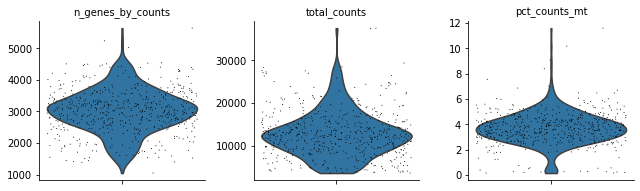

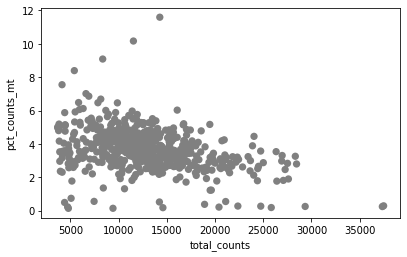

Median total counts = 12361.0
min_count= 10000
max_count= 40000
394 samples pass the count filter
561  samples pass the mt filter
Samples selected 394





8305C_THYROID_umi.txt


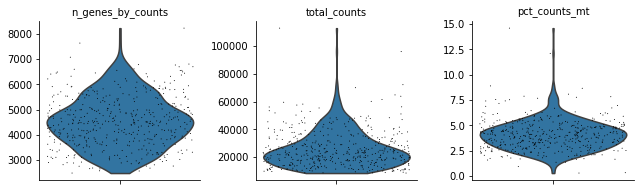

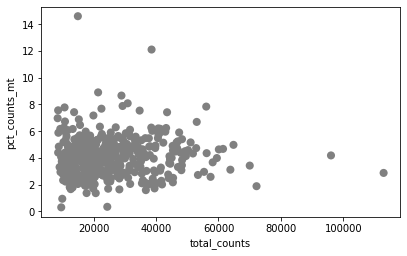

Median total counts = 23045.0
min_count= 10000
max_count= 40000
384 samples pass the count filter
459  samples pass the mt filter
Samples selected 384





93VU_UPPER_AERODIGESTIVE_TRACT_umi.txt


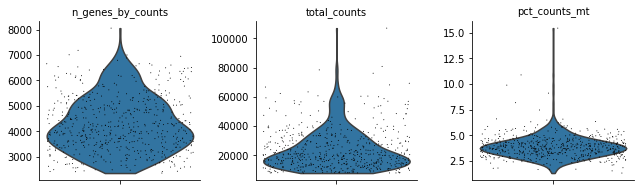

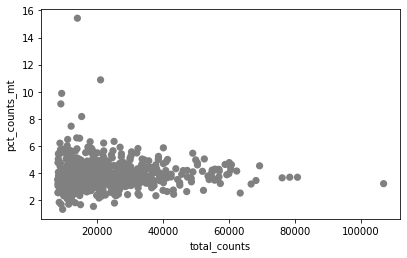

Median total counts = 20350.0
min_count= 10000
max_count= 40000
464 samples pass the count filter
573  samples pass the mt filter
Samples selected 464





A2058_SKIN_umi.txt


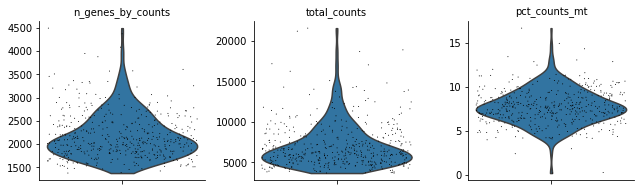

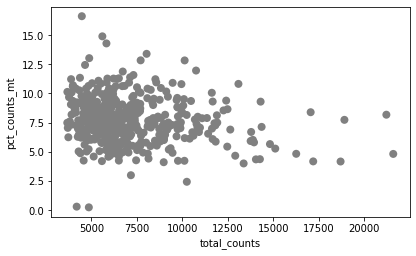

Median total counts = 6272.0
min_count= 10000
max_count= 40000
55 samples pass the count filter
469  samples pass the mt filter
Samples selected 55





A375_SKIN_umi.txt


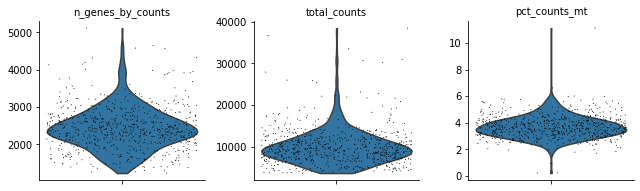

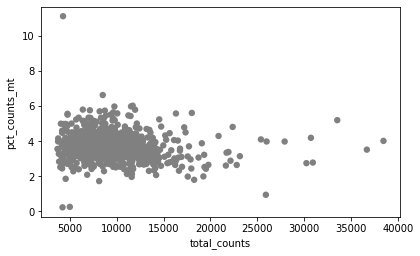

Median total counts = 9361.5
min_count= 10000
max_count= 40000
296 samples pass the count filter
726  samples pass the mt filter
Samples selected 296





ABC1_LUNG_umi.txt


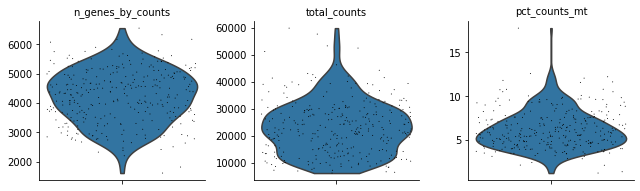

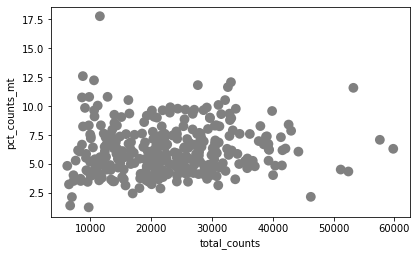

Median total counts = 22291.0
min_count= 10000
max_count= 40000
272 samples pass the count filter
313  samples pass the mt filter
Samples selected 272





BFTC909_KIDNEY_umi.txt


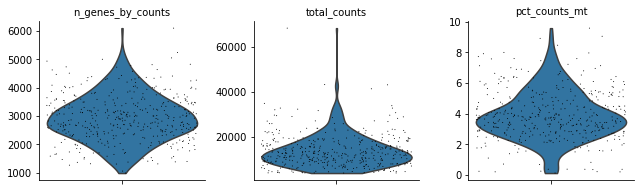

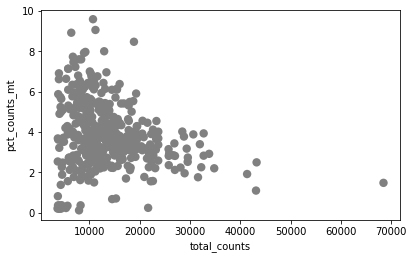

Median total counts = 12406.0
min_count= 10000
max_count= 40000
277 samples pass the count filter
423  samples pass the mt filter
Samples selected 277





C32_SKIN_umi.txt


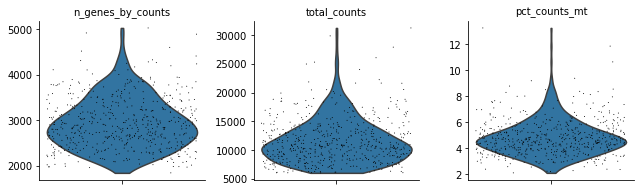

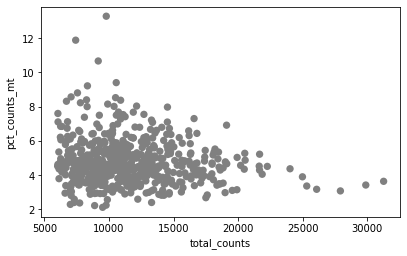

Median total counts = 10822.5
min_count= 10000
max_count= 40000
342 samples pass the count filter
556  samples pass the mt filter
Samples selected 342





CHLA10_umi.txt


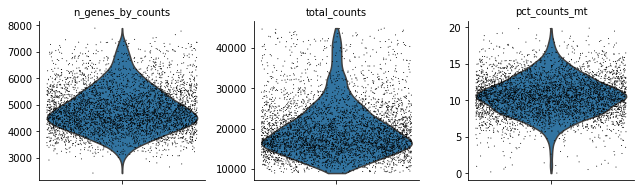

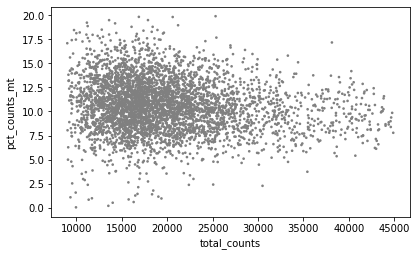

Median total counts = 18366.0
min_count= 10000
max_count= 60000
4254 samples pass the count filter
4308  samples pass the mt filter
Samples selected 4254





CHLA9_umi.txt


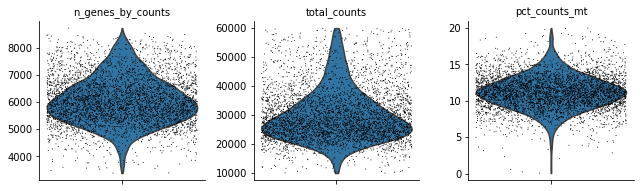

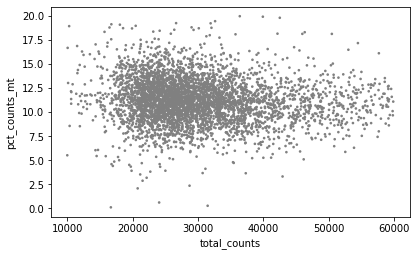

Median total counts = 28080.0
min_count= 10000
max_count= 60000
4317 samples pass the count filter
4317  samples pass the mt filter
Samples selected 4317





CL34_LARGE_INTESTINE_umi.txt


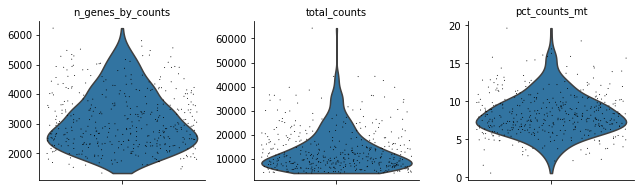

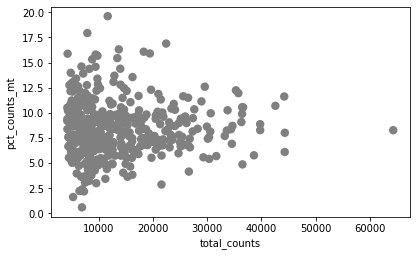

Median total counts = 11078.5
min_count= 10000
max_count= 40000
232 samples pass the count filter
418  samples pass the mt filter
Samples selected 232





COLO680N_OESOPHAGUS_umi.txt


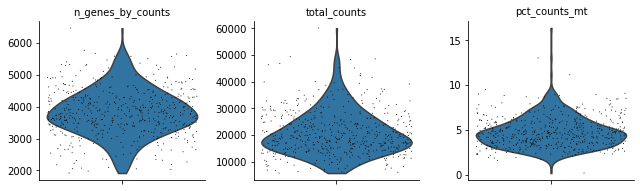

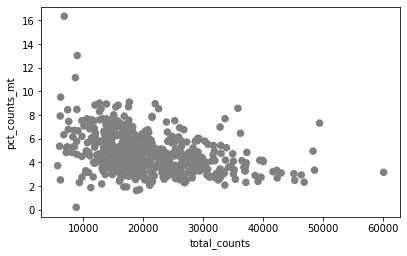

Median total counts = 19338.0
min_count= 10000
max_count= 40000
481 samples pass the count filter
524  samples pass the mt filter
Samples selected 481





COLO741_SKIN_umi.txt


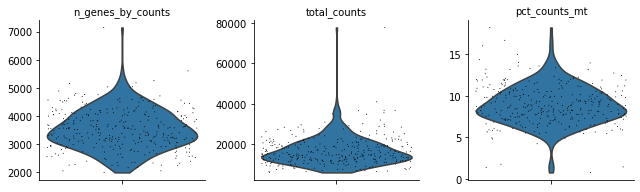

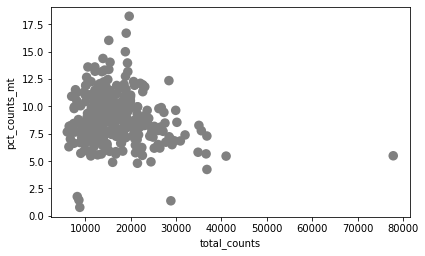

Median total counts = 15160.0
min_count= 10000
max_count= 40000
292 samples pass the count filter
329  samples pass the mt filter
Samples selected 292





DAOY_CENTRAL_NERVOUS_SYSTEM_umi.txt


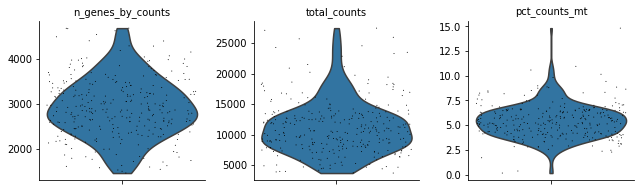

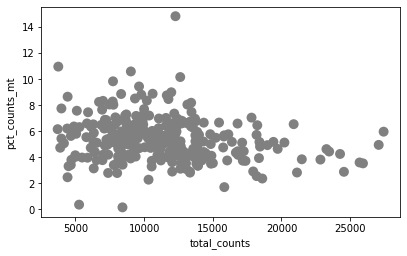

Median total counts = 10598.0
min_count= 10000
max_count= 40000
170 samples pass the count filter
304  samples pass the mt filter
Samples selected 170





EFM192A_BREAST_umi.txt


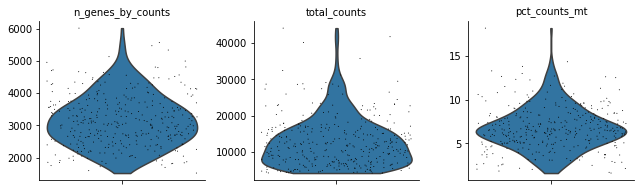

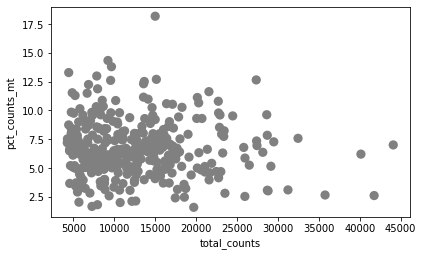

Median total counts = 11663.0
min_count= 10000
max_count= 40000
209 samples pass the count filter
351  samples pass the mt filter
Samples selected 209





HEC59_ENDOMETRIUM_umi.txt


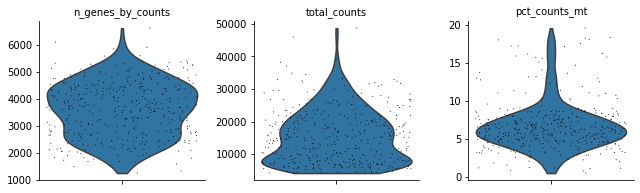

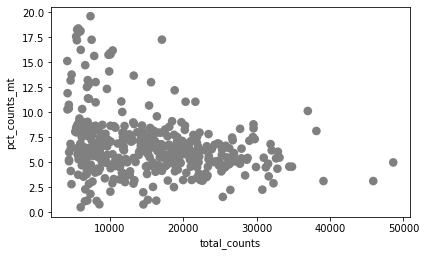

Median total counts = 14579.5
min_count= 10000
max_count= 40000
264 samples pass the count filter
402  samples pass the mt filter
Samples selected 264





HELA_KO_umi.txt


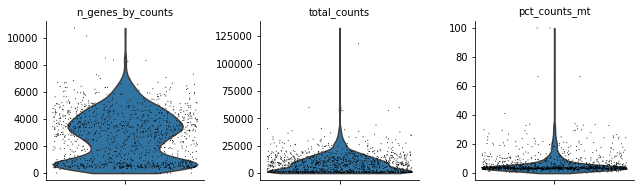

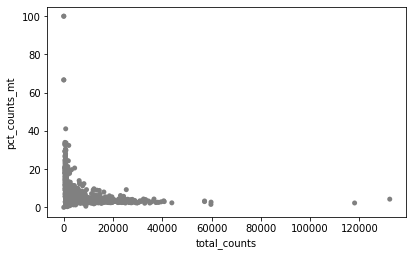

Median total counts = 7062.0
min_count= 10000
max_count= 40000
424 samples pass the count filter
1138  samples pass the mt filter
Samples selected 424





HELA_WT_umi.txt


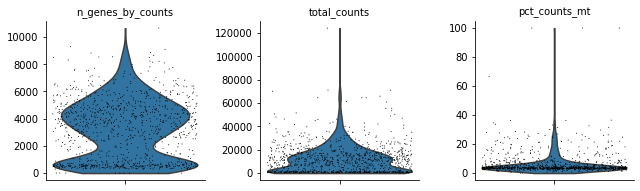

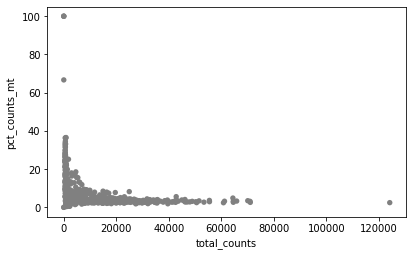

Median total counts = 9968.0
min_count= 10000
max_count= 40000
484 samples pass the count filter
972  samples pass the mt filter
Samples selected 484





HMC18_BREAST_umi.txt


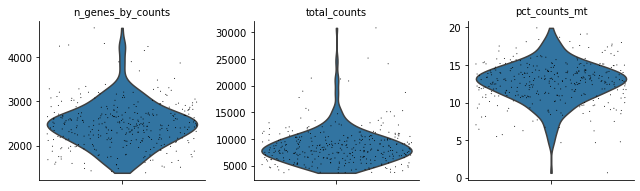

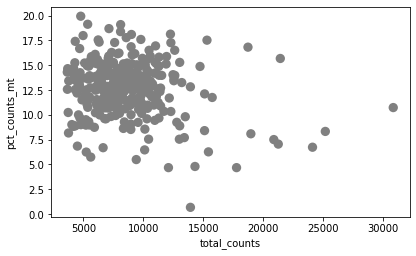

Median total counts = 8053.0
min_count= 10000
max_count= 40000
85 samples pass the count filter
346  samples pass the mt filter
Samples selected 85





HOS_BONE_umi.txt


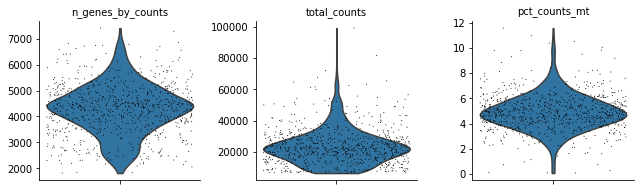

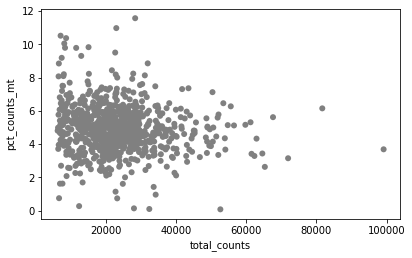

Median total counts = 22062.5
min_count= 10000
max_count= 40000
687 samples pass the count filter
832  samples pass the mt filter
Samples selected 687





HT1080_SOFT_TISSUE_umi.txt


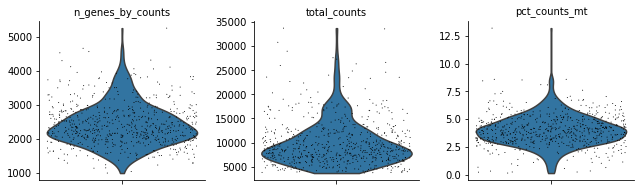

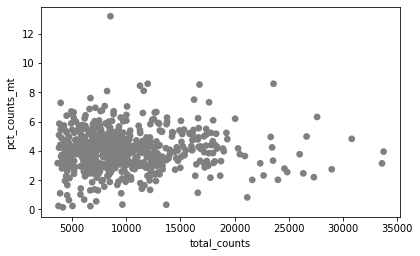

Median total counts = 8734.0
min_count= 10000
max_count= 40000
241 samples pass the count filter
659  samples pass the mt filter
Samples selected 241





HUH6_LIVER_umi.txt


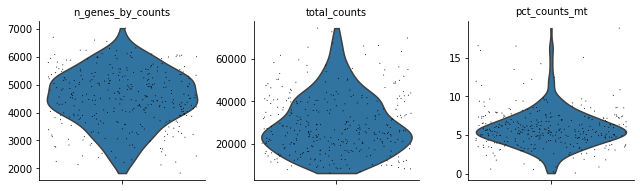

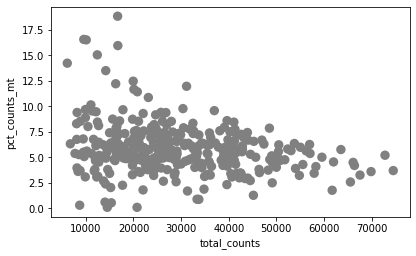

Median total counts = 26288.0
min_count= 10000
max_count= 40000
245 samples pass the count filter
339  samples pass the mt filter
Samples selected 245





IALM_LUNG_umi.txt


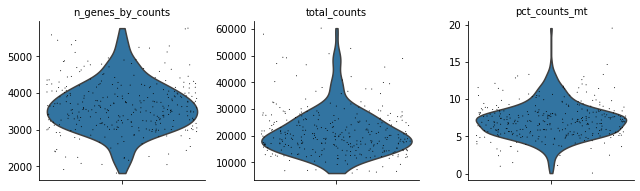

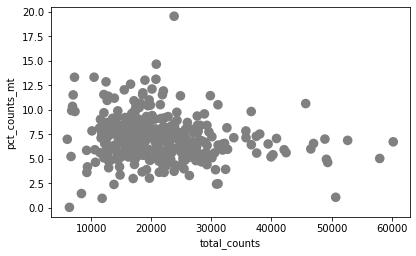

Median total counts = 19674.5
min_count= 10000
max_count= 40000
298 samples pass the count filter
324  samples pass the mt filter
Samples selected 298





IGR1_SKIN_umi.txt


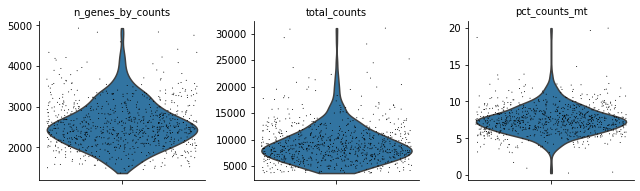

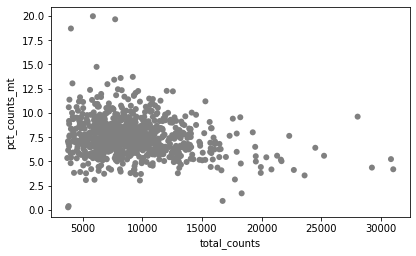

Median total counts = 8592.0
min_count= 10000
max_count= 40000
279 samples pass the count filter
833  samples pass the mt filter
Samples selected 279





IGR37_SKIN_umi.txt


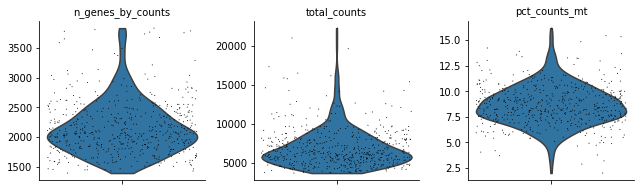

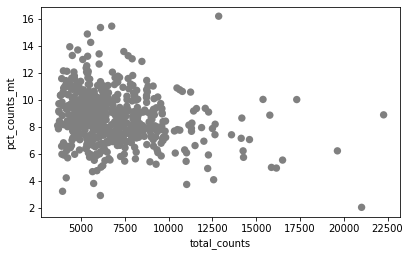

Median total counts = 6257.0
min_count= 10000
max_count= 40000
45 samples pass the count filter
549  samples pass the mt filter
Samples selected 45





JHU006_UPPER_AERODIGESTIVE_TRACT_umi.txt


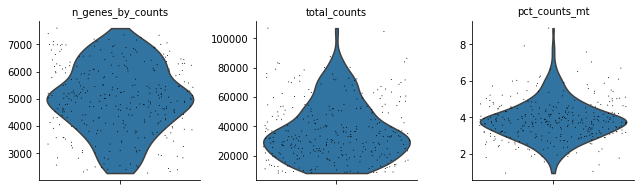

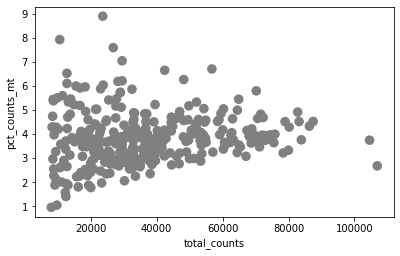

Median total counts = 32845.0
min_count= 10000
max_count= 40000
198 samples pass the count filter
325  samples pass the mt filter
Samples selected 198





JHU011_UPPER_AERODIGESTIVE_TRACT_umi.txt


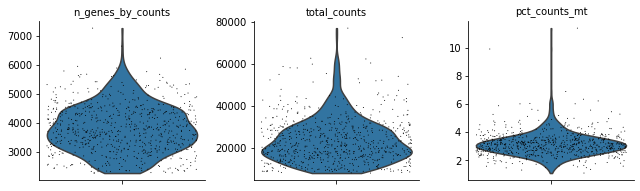

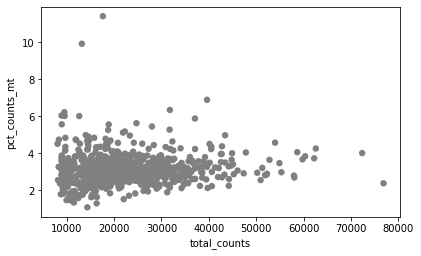

Median total counts = 21532.0
min_count= 10000
max_count= 40000
629 samples pass the count filter
717  samples pass the mt filter
Samples selected 629





JHU029_UPPER_AERODIGESTIVE_TRACT_umi.txt


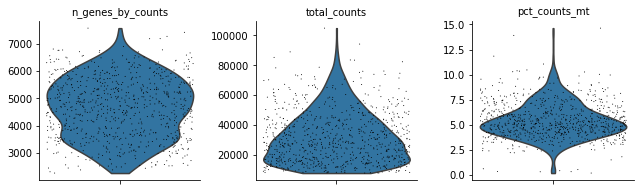

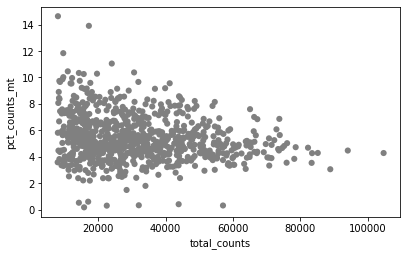

Median total counts = 28713.0
min_count= 10000
max_count= 40000
536 samples pass the count filter
797  samples pass the mt filter
Samples selected 536





KYSE520_OESOPHAGUS_umi.txt


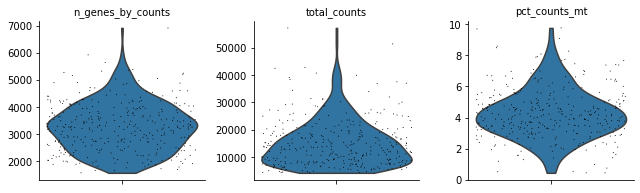

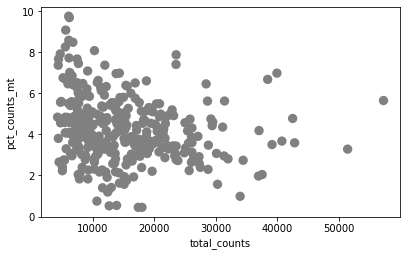

Median total counts = 13614.0
min_count= 10000
max_count= 40000
224 samples pass the count filter
343  samples pass the mt filter
Samples selected 224





LS180_LARGE_INTESTINE_umi.txt


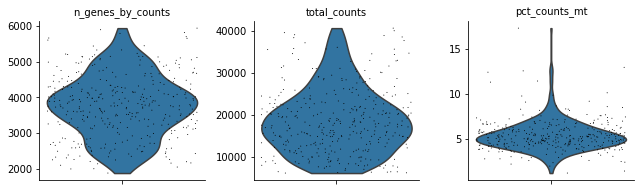

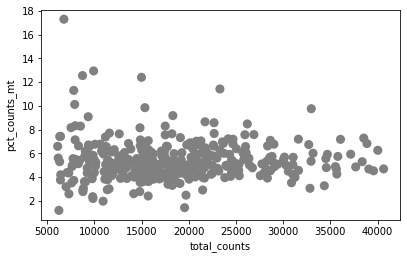

Median total counts = 17568.0
min_count= 10000
max_count= 40000
306 samples pass the count filter
362  samples pass the mt filter
Samples selected 306





MSTO211H_PLEURA_umi.txt


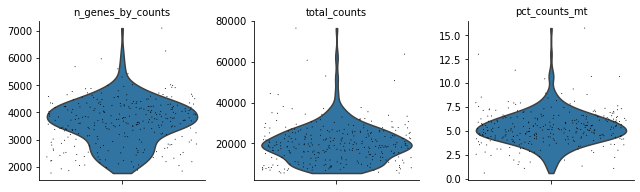

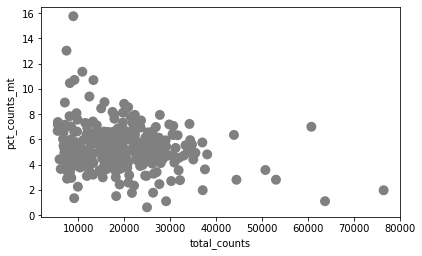

Median total counts = 19063.0
min_count= 10000
max_count= 40000
249 samples pass the count filter
303  samples pass the mt filter
Samples selected 249





NCIH1048_LUNG_umi.txt


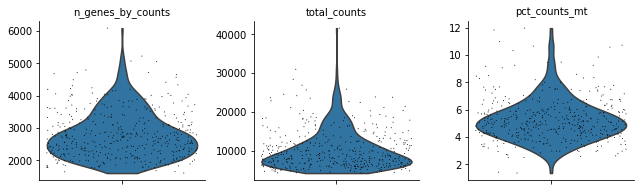

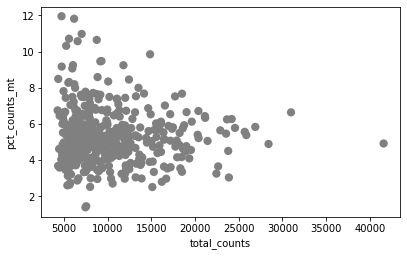

Median total counts = 8807.0
min_count= 10000
max_count= 40000
171 samples pass the count filter
438  samples pass the mt filter
Samples selected 171





NCIH1299_LUNG_umi.txt


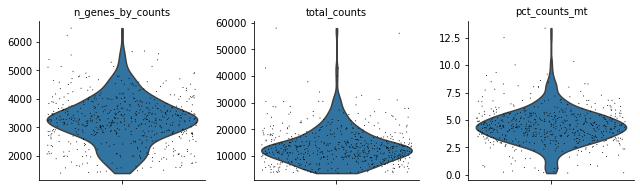

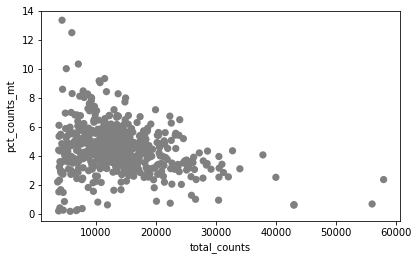

Median total counts = 12798.5
min_count= 10000
max_count= 40000
393 samples pass the count filter
570  samples pass the mt filter
Samples selected 393





NCIH1568_LUNG_umi.txt


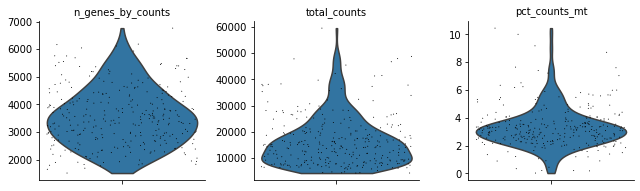

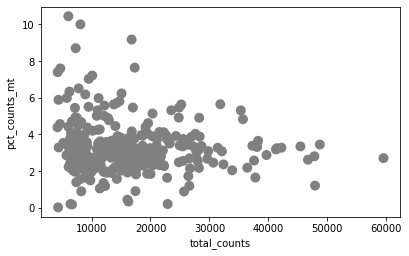

Median total counts = 14405.5
min_count= 10000
max_count= 40000
199 samples pass the count filter
302  samples pass the mt filter
Samples selected 199





NCIH1944_LUNG_umi.txt


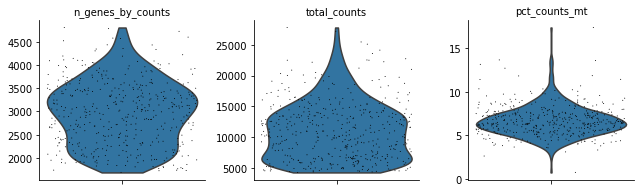

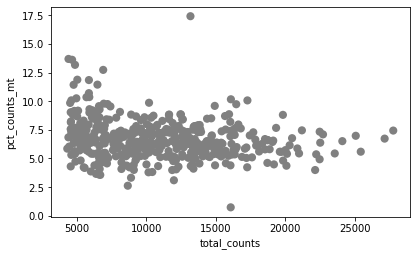

Median total counts = 10568.5
min_count= 10000
max_count= 40000
247 samples pass the count filter
450  samples pass the mt filter
Samples selected 247





NCIH2077_LUNG_umi.txt


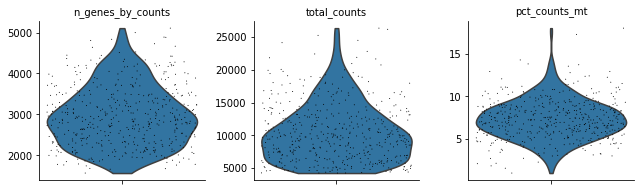

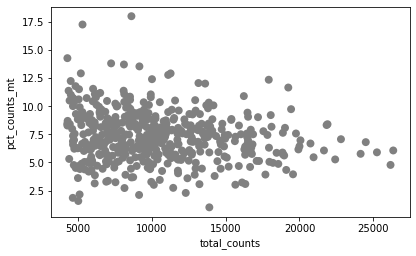

Median total counts = 9755.0
min_count= 10000
max_count= 40000
219 samples pass the count filter
475  samples pass the mt filter
Samples selected 219





NCIH2110_LUNG_umi.txt


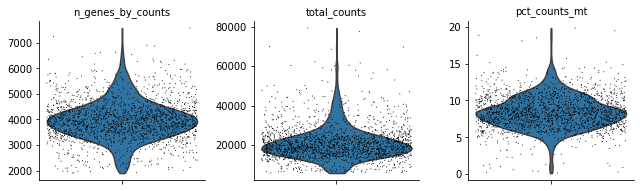

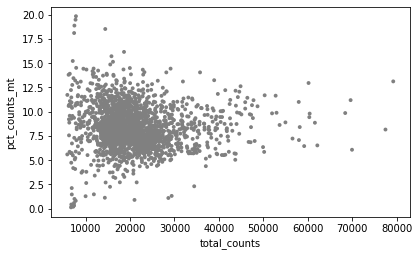

Median total counts = 19604.5
min_count= 10000
max_count= 40000
1825 samples pass the count filter
1994  samples pass the mt filter
Samples selected 1825





NCIH2228_LUNG_umi.txt


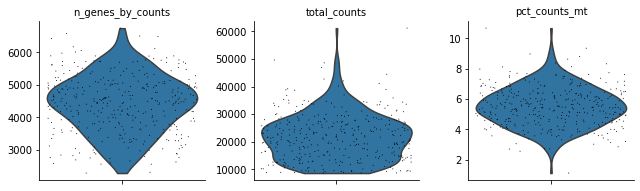

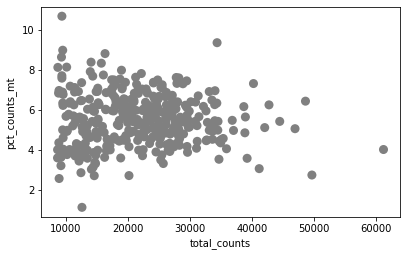

Median total counts = 21518.0
min_count= 10000
max_count= 40000
336 samples pass the count filter
367  samples pass the mt filter
Samples selected 336





NCIH2452_PLEURA_umi.txt


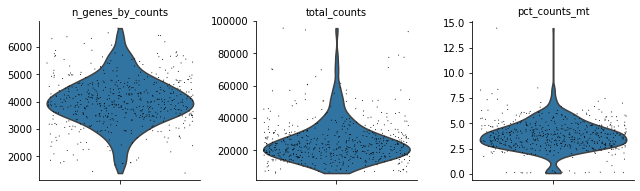

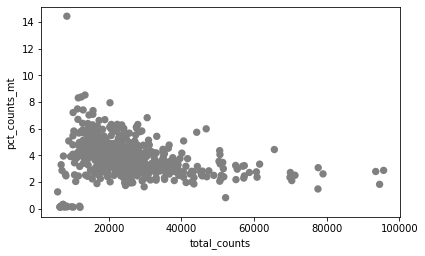

Median total counts = 22751.0
min_count= 10000
max_count= 40000
470 samples pass the count filter
551  samples pass the mt filter
Samples selected 470





NCIH358_LUNG_umi.txt


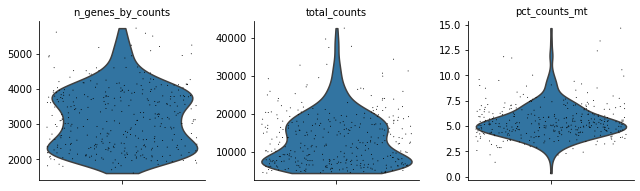

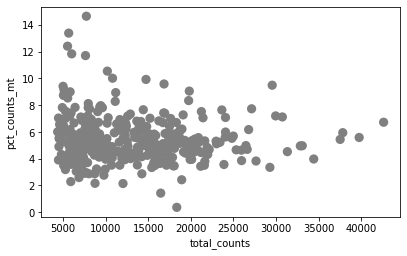

Median total counts = 12052.0
min_count= 10000
max_count= 40000
204 samples pass the count filter
351  samples pass the mt filter
Samples selected 204





NCIH460_LUNG_umi.txt


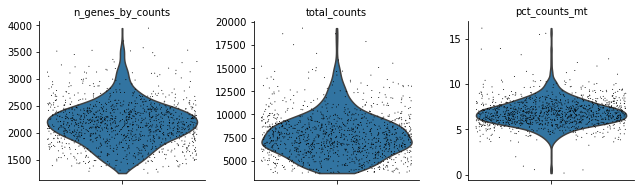

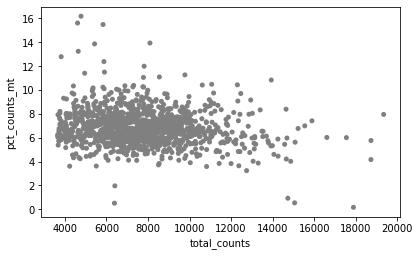

Median total counts = 7516.0
min_count= 10000
max_count= 40000
169 samples pass the count filter
1185  samples pass the mt filter
Samples selected 169





OVK18_OVARY_umi.txt


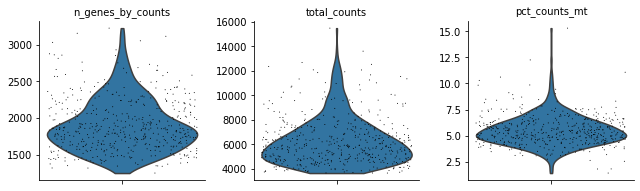

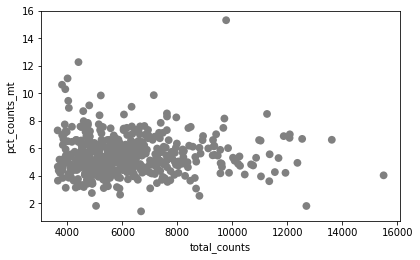

Median total counts = 5815.0
min_count= 10000
max_count= 40000
26 samples pass the count filter
493  samples pass the mt filter
Samples selected 26





PANC0203_PANCREAS_umi.txt


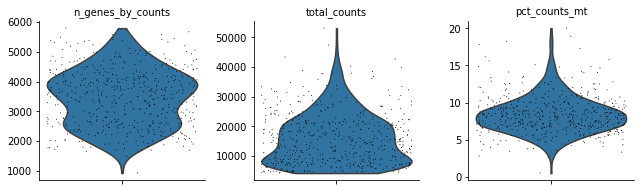

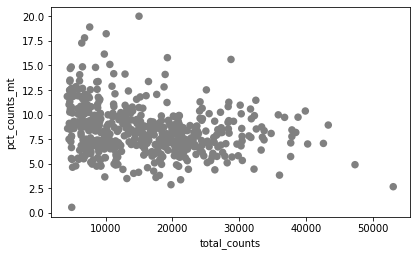

Median total counts = 14915.0
min_count= 10000
max_count= 40000
355 samples pass the count filter
530  samples pass the mt filter
Samples selected 354





RERFLCAI_LUNG_umi.txt


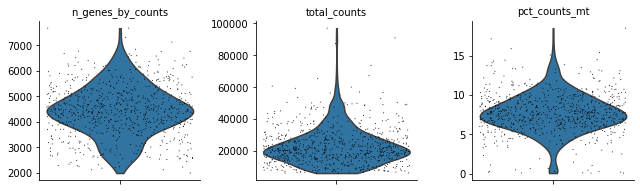

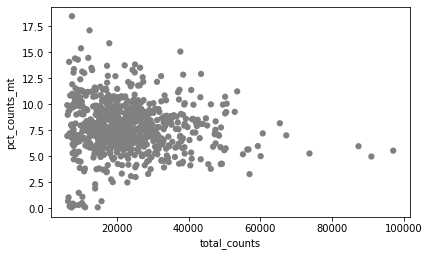

Median total counts = 20847.0
min_count= 10000
max_count= 40000
632 samples pass the count filter
763  samples pass the mt filter
Samples selected 632





SCC25_UPPER_AERODIGESTIVE_TRACT_umi.txt


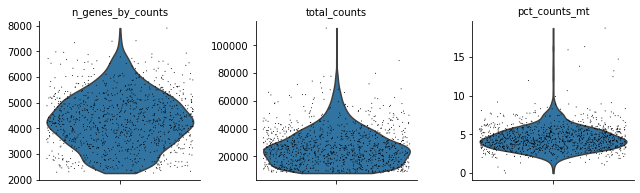

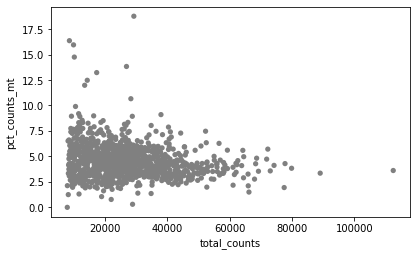

Median total counts = 25010.0
min_count= 10000
max_count= 40000
852 samples pass the count filter
1079  samples pass the mt filter
Samples selected 852





SCC47_UPPER_AERODIGESTIVE_TRACT_umi.txt


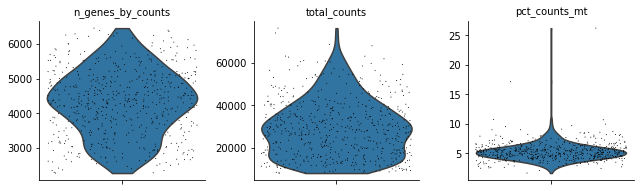

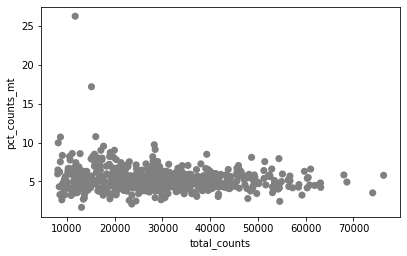

Median total counts = 27998.0
min_count= 10000
max_count= 40000
452 samples pass the count filter
591  samples pass the mt filter
Samples selected 451





SCC9_UPPER_AERODIGESTIVE_TRACT_umi.txt


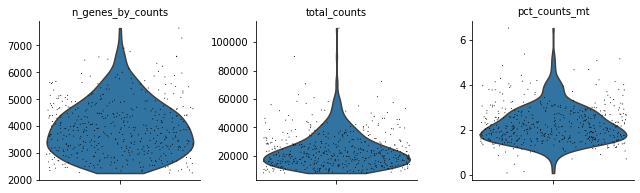

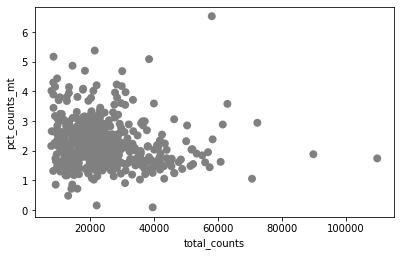

Median total counts = 21095.0
min_count= 10000
max_count= 40000
401 samples pass the count filter
475  samples pass the mt filter
Samples selected 401





SH10TC_STOMACH_umi.txt


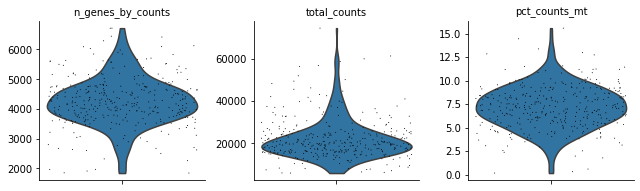

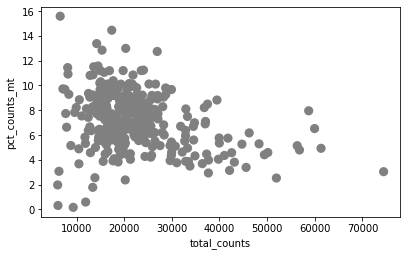

Median total counts = 19842.0
min_count= 10000
max_count= 40000
322 samples pass the count filter
355  samples pass the mt filter
Samples selected 322





SKMEL30_SKIN_umi.txt


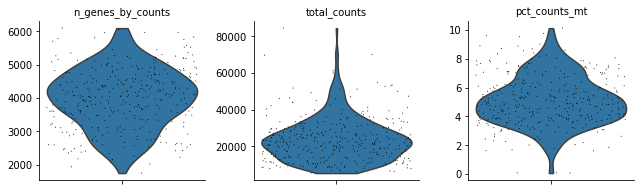

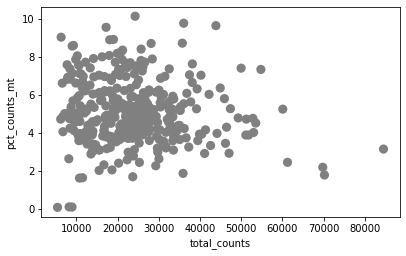

Median total counts = 22130.0
min_count= 10000
max_count= 40000
297 samples pass the count filter
355  samples pass the mt filter
Samples selected 297





SNU738_CENTRAL_NERVOUS_SYSTEM_umi.txt


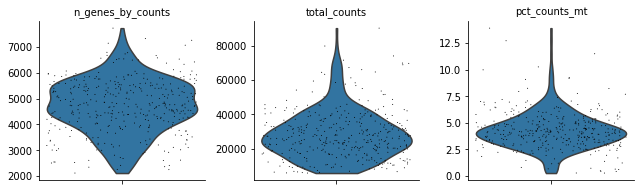

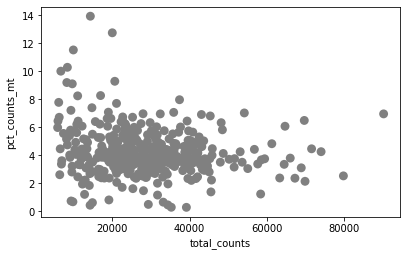

Median total counts = 26466.0
min_count= 10000
max_count= 40000
289 samples pass the count filter
379  samples pass the mt filter
Samples selected 289





SNUC4_LARGE_INTESTINE_umi.txt


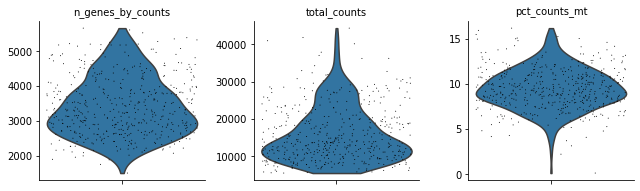

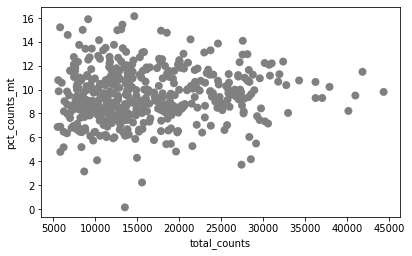

Median total counts = 13729.0
min_count= 10000
max_count= 40000
359 samples pass the count filter
471  samples pass the mt filter
Samples selected 359





SW1990_PANCREAS_umi.txt


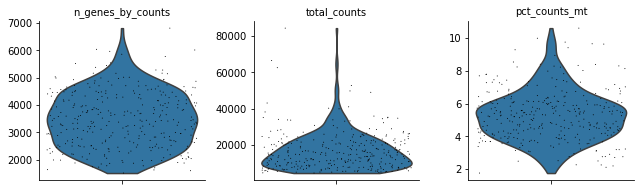

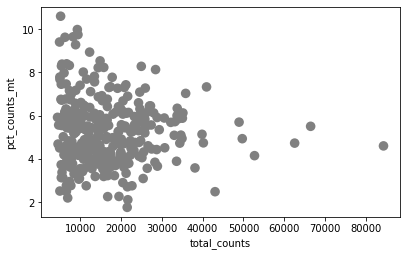

Median total counts = 14645.0
min_count= 10000
max_count= 40000
220 samples pass the count filter
325  samples pass the mt filter
Samples selected 220





TC71_umi.txt


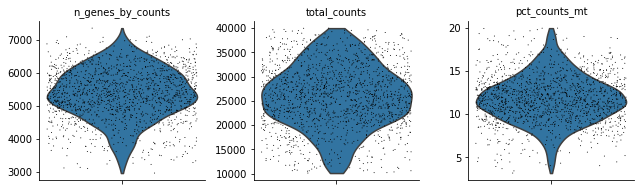

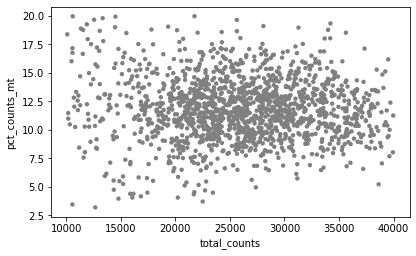

Median total counts = 25969.0
min_count= 10000
max_count= 40000
1531 samples pass the count filter
1531  samples pass the mt filter
Samples selected 1531





TCCSUP_URINARY_TRACT_umi.txt


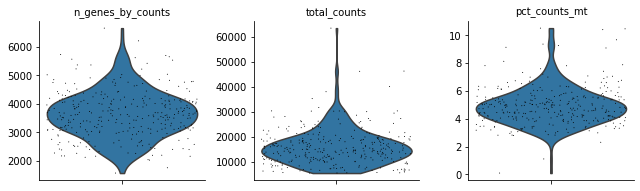

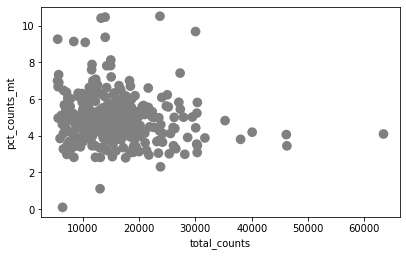

Median total counts = 14956.5
min_count= 10000
max_count= 40000
259 samples pass the count filter
318  samples pass the mt filter
Samples selected 259





TE14_OESOPHAGUS_umi.txt


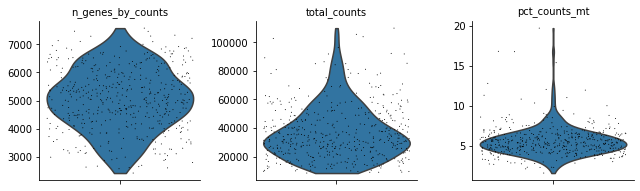

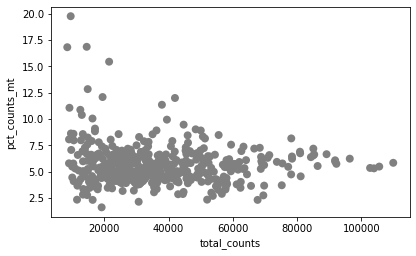

Median total counts = 33024.0
min_count= 10000
max_count= 40000
295 samples pass the count filter
474  samples pass the mt filter
Samples selected 295





TE6_OESOPHAGUS_umi.txt


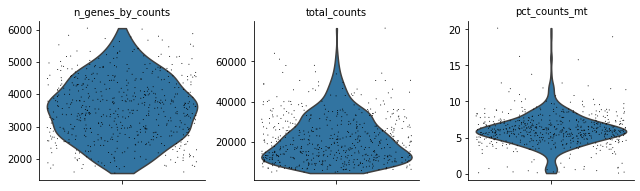

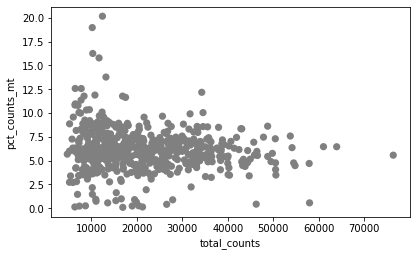

Median total counts = 19313.5
min_count= 10000
max_count= 40000
448 samples pass the count filter
575  samples pass the mt filter
Samples selected 447





TEN_ENDOMETRIUM_umi.txt


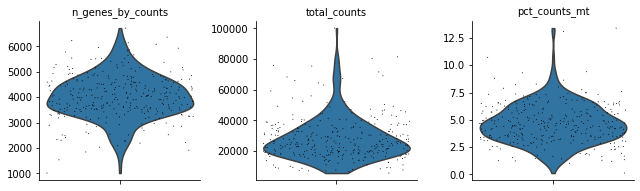

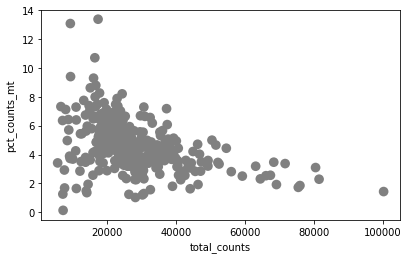

Median total counts = 24848.0
min_count= 10000
max_count= 40000
260 samples pass the count filter
320  samples pass the mt filter
Samples selected 260





TOV21G_OVARY_umi.txt


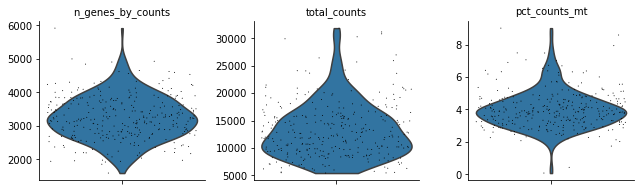

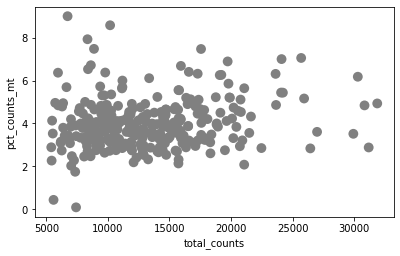

Median total counts = 12221.0
min_count= 10000
max_count= 40000
216 samples pass the count filter
311  samples pass the mt filter
Samples selected 216





VMCUB1_URINARY_TRACT_umi.txt


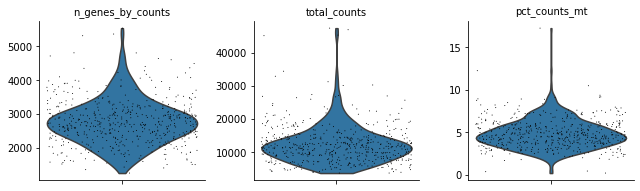

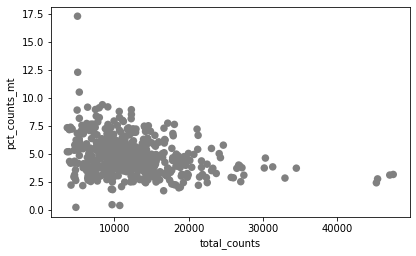

Median total counts = 11525.0
min_count= 10000
max_count= 40000
327 samples pass the count filter
531  samples pass the mt filter
Samples selected 327





VMRCRCZ_KIDNEY_umi.txt


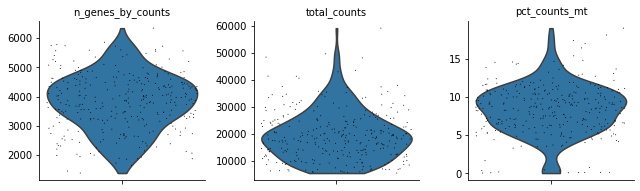

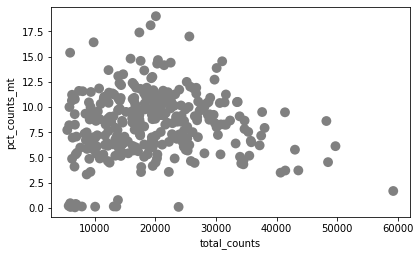

Median total counts = 18506.5
min_count= 10000
max_count= 40000
254 samples pass the count filter
310  samples pass the mt filter
Samples selected 254





Y79_umi.txt


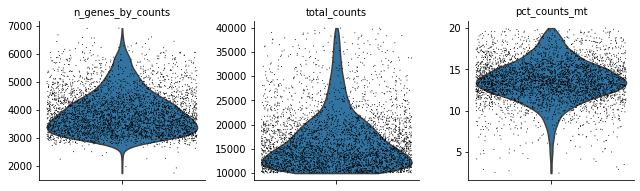

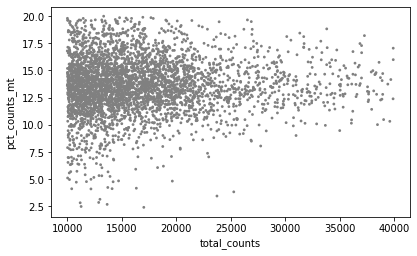

Median total counts = 15147.5
min_count= 10000
max_count= 40000
3830 samples pass the count filter
3830  samples pass the mt filter
Samples selected 3830





YD38_UPPER_AERODIGESTIVE_TRACT_umi.txt


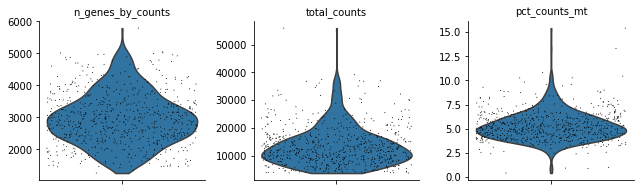

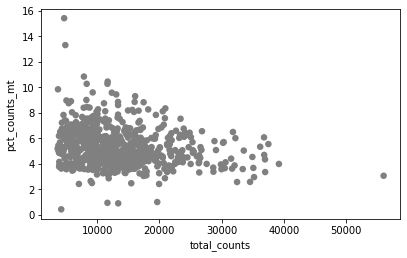

Median total counts = 12026.0
min_count= 10000
max_count= 40000
445 samples pass the count filter
699  samples pass the mt filter
Samples selected 445





ZR751_BREAST_umi.txt


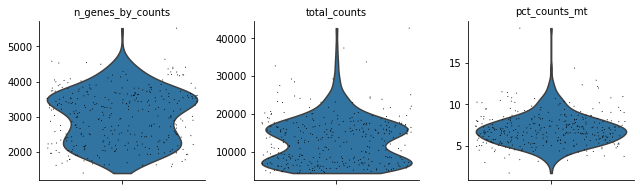

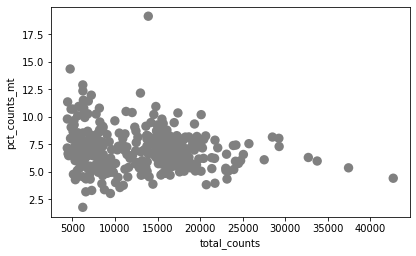

Median total counts = 13016.0
min_count= 10000
max_count= 40000
205 samples pass the count filter
340  samples pass the mt filter
Samples selected 205







In [8]:
# Just do qc and select by length

division_factor = 1

recompute_files = True

median_counts = []

for fname in files:
    print(fname)
    if (not path.exists(folder+fname[:-8]+'_raw.h5ad'))|(recompute_files):
        df = pd.read_csv(folder+fname,delimiter='\t')
        adata_k = sc.AnnData(X=df[df.columns[1:]].to_numpy().transpose())
        adata_k.obs_names = list(df.columns[1:])
        adata_k.var_names = list(df[df.columns[0]])
        adata_k.var_names_make_unique()
        adata_k.X = adata_k.X/division_factor
        # qc
        adata_k.var['mt'] = adata_k.var_names.str.startswith('MT-')
        sc.pp.calculate_qc_metrics(adata_k, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
        sc.pl.violin(adata_k, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'], jitter=0.4, multi_panel=True)
        sc.pl.scatter(adata_k, x='total_counts', y='pct_counts_mt')

        median_count = np.median(adata_k.obs['total_counts'])
        median_counts.append(median_count)
        print('Median total counts =',median_count)
        #min_count = np.max((median_count/2,7500))
        #if min_count>10000:
        min_count=10000
        #max_count=median_count*3
        max_count=40000
        
        #if 'Y79' in fname:
        #    min_count = 7500
        #    max_count = 40000
        if 'CHLA9' in fname:
            min_count = 10000
            max_count = 60000
        if 'CHLA10' in fname:
            min_count = 10000
            max_count = 60000
        #if 'TC71' in fname:
        #    min_count = 10000
        #    max_count = 40000
        if 'HELA_WT' in fname:
            median_count = 10001

        print('min_count=',min_count)
        print('max_count=',max_count)    

        inds1 = np.where((adata_k.obs['total_counts']>min_count) & (adata_k.obs['total_counts']<max_count))
        inds2 = np.where(adata_k.obs['pct_counts_mt']<20)
        print(len(inds1[0]),'samples pass the count filter')
        print(len(inds2[0]),' samples pass the mt filter')
        ind_samples = np.intersect1d(inds1[0],inds2[0])
        print('Samples selected',len(ind_samples))
        adata_k = adata_k[ind_samples,:]
        #if (len(ind_samples)>=300)&(median_count>10000):
        if len(ind_samples)>=300:
            adata_k.write_h5ad(folder+fname[:-8]+'_raw.h5ad',compression='gzip')
    print('===========================\n\n\n\n\n')
    
    

In [ ]:
for i,f in enumerate(files):
    print(f+'\t'+str(median_counts[i]))
plt.plot(median_counts,'ko-')
plt.plot([0,len(median_counts)],[10000,10000],'r--')
plt.show()
plt.hist(median_counts)
plt.show()
print('Mean median count=',np.mean(median_counts))

Found  29 files: ['42MGBA_CENTRAL_NERVOUS_SYSTEM_raw.h5ad', '8305C_THYROID_raw.h5ad', '93VU_UPPER_AERODIGESTIVE_TRACT_raw.h5ad', 'C32_SKIN_raw.h5ad', 'CHLA10_raw.h5ad', 'CHLA9_raw.h5ad', 'COLO680N_OESOPHAGUS_raw.h5ad', 'HELA_KO_raw.h5ad', 'HELA_WT_raw.h5ad', 'HOS_BONE_raw.h5ad', 'JHU011_UPPER_AERODIGESTIVE_TRACT_raw.h5ad', 'JHU029_UPPER_AERODIGESTIVE_TRACT_raw.h5ad', 'LS180_LARGE_INTESTINE_raw.h5ad', 'NCIH1299_LUNG_raw.h5ad', 'NCIH2110_LUNG_raw.h5ad', 'NCIH2228_LUNG_raw.h5ad', 'NCIH2452_PLEURA_raw.h5ad', 'PANC0203_PANCREAS_raw.h5ad', 'RERFLCAI_LUNG_raw.h5ad', 'SCC25_UPPER_AERODIGESTIVE_TRACT_raw.h5ad', 'SCC47_UPPER_AERODIGESTIVE_TRACT_raw.h5ad', 'SCC9_UPPER_AERODIGESTIVE_TRACT_raw.h5ad', 'SH10TC_STOMACH_raw.h5ad', 'SNUC4_LARGE_INTESTINE_raw.h5ad', 'TC71_raw.h5ad', 'TE6_OESOPHAGUS_raw.h5ad', 'VMCUB1_URINARY_TRACT_raw.h5ad', 'Y79_raw.h5ad', 'YD38_UPPER_AERODIGESTIVE_TRACT_raw.h5ad']
42MGBA_CENTRAL_NERVOUS_SYSTEM_raw.h5ad


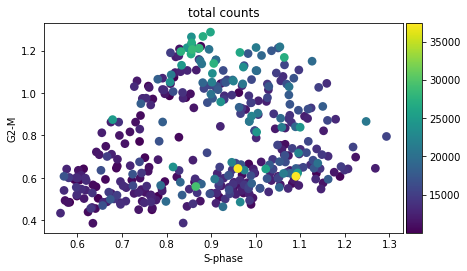



8305C_THYROID_raw.h5ad


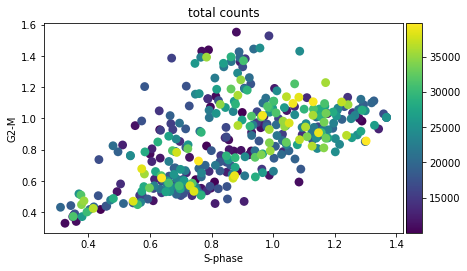



93VU_UPPER_AERODIGESTIVE_TRACT_raw.h5ad


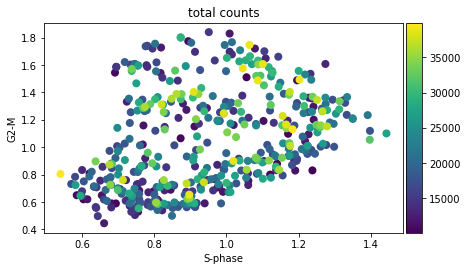



C32_SKIN_raw.h5ad


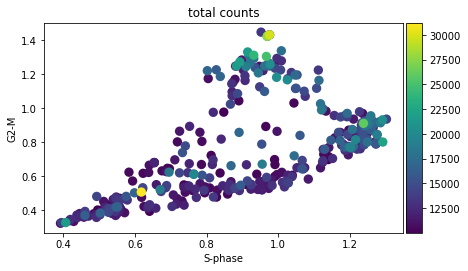



CHLA10_raw.h5ad


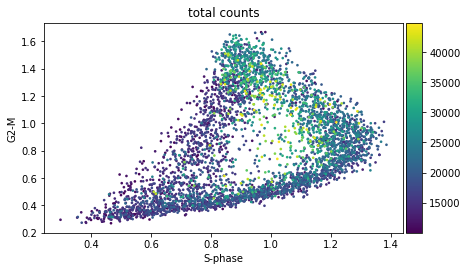



CHLA9_raw.h5ad


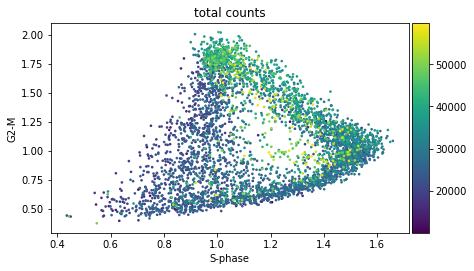



COLO680N_OESOPHAGUS_raw.h5ad


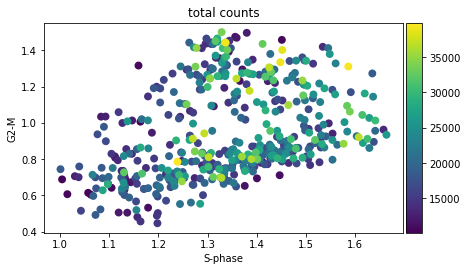



HELA_KO_raw.h5ad


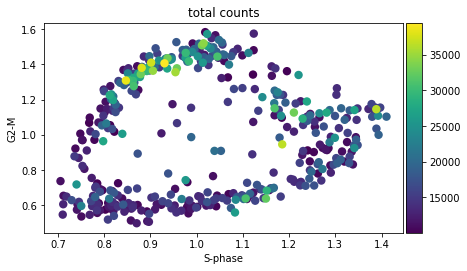



HELA_WT_raw.h5ad


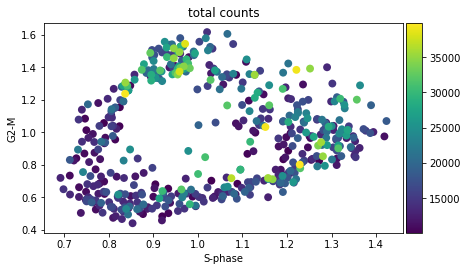



HOS_BONE_raw.h5ad


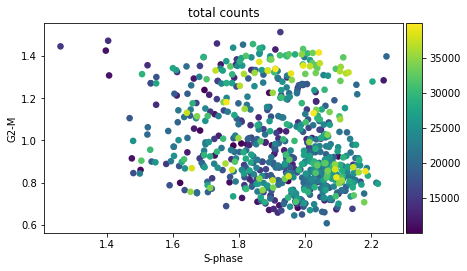



JHU011_UPPER_AERODIGESTIVE_TRACT_raw.h5ad


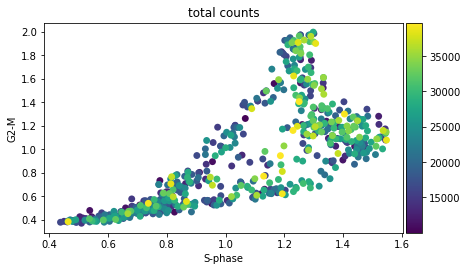



JHU029_UPPER_AERODIGESTIVE_TRACT_raw.h5ad


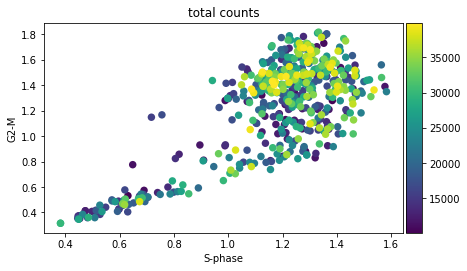



LS180_LARGE_INTESTINE_raw.h5ad


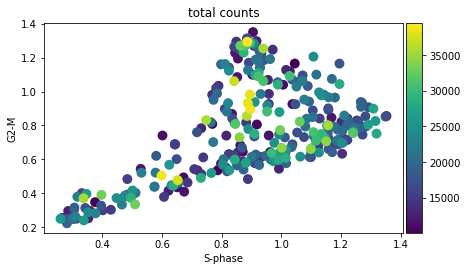



NCIH1299_LUNG_raw.h5ad


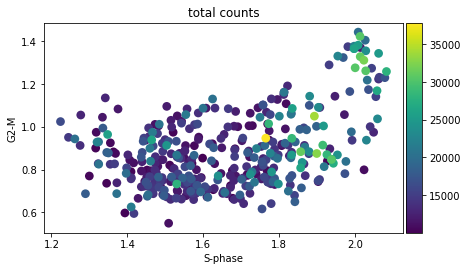



NCIH2110_LUNG_raw.h5ad


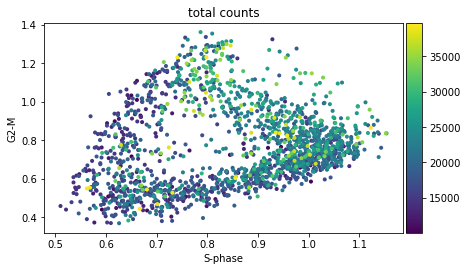



NCIH2228_LUNG_raw.h5ad


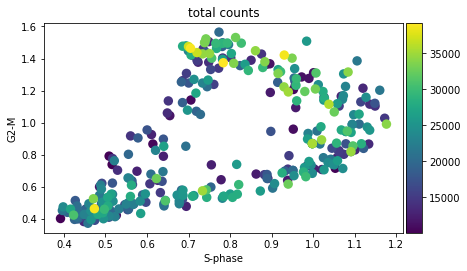



NCIH2452_PLEURA_raw.h5ad


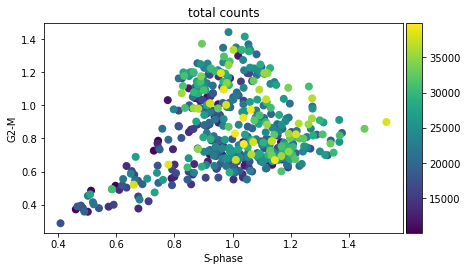



PANC0203_PANCREAS_raw.h5ad


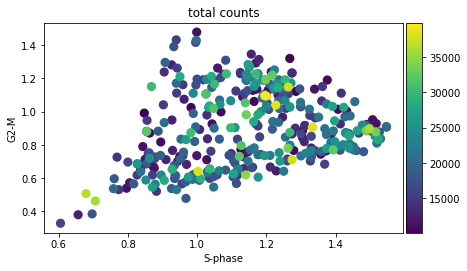



RERFLCAI_LUNG_raw.h5ad


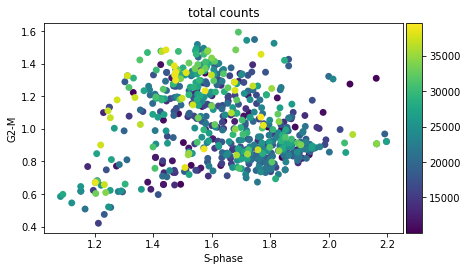



SCC25_UPPER_AERODIGESTIVE_TRACT_raw.h5ad


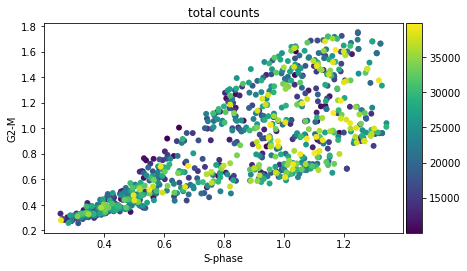



SCC47_UPPER_AERODIGESTIVE_TRACT_raw.h5ad


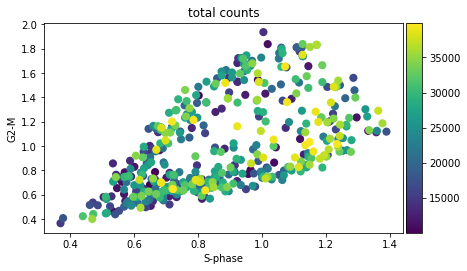



SCC9_UPPER_AERODIGESTIVE_TRACT_raw.h5ad


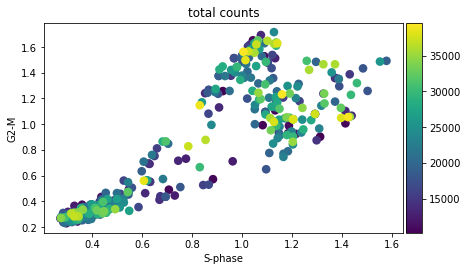



SH10TC_STOMACH_raw.h5ad


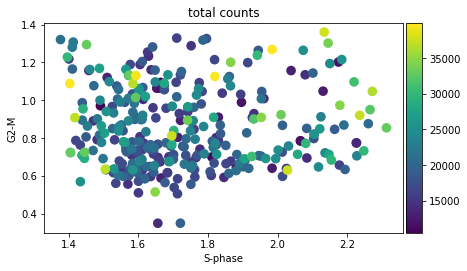



SNUC4_LARGE_INTESTINE_raw.h5ad


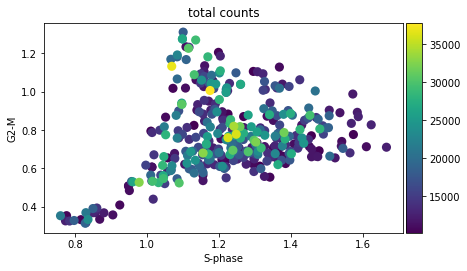



TC71_raw.h5ad


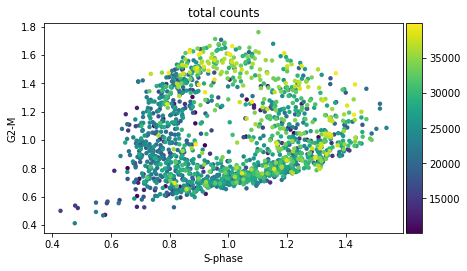



TE6_OESOPHAGUS_raw.h5ad


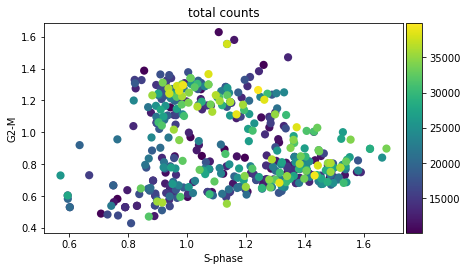



VMCUB1_URINARY_TRACT_raw.h5ad


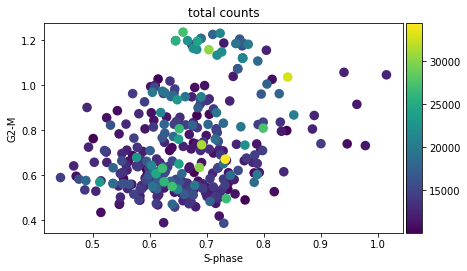



Y79_raw.h5ad


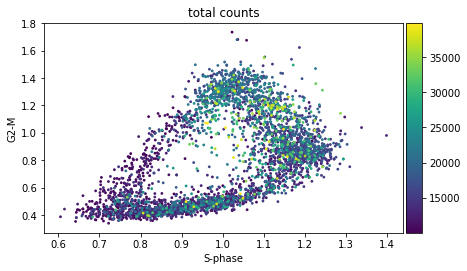



YD38_UPPER_AERODIGESTIVE_TRACT_raw.h5ad


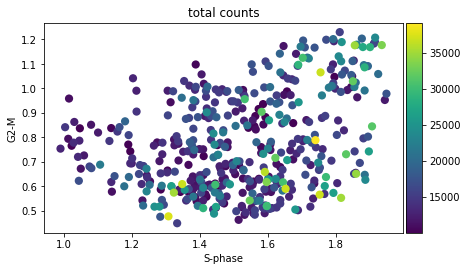

In [18]:
# standard (first) preprocessing

files = [f for f in listdir(folder) if (isfile(join(folder, f)))&('_raw.h' in f)&(f.endswith('.h5ad'))]
print('Found ',len(files),'files:',files)

#files = ['JHU011_UPPER_AERODIGESTIVE_TRACT_umi.txt']
#files = ['CHLA9_raw.h5ad','CHLA10_raw.h5ad','TC71_raw.h5ad','Y79_raw.h5ad']
#files = ['CHLA9_raw.h5ad']
#files = ['CHLA10_raw.h5ad']
#files = ['TC71_raw.h5ad']
#files = ['HELA_KO_raw.h5ad']
#files = ['Y79_raw.h5ad']

recompute_files = False

for fname in files:
    print(fname)
    adata_k = sc.read_h5ad(folder+fname)
    fname_out = folder+fname[:-9]+'_proc.h5ad'
    if (path.exists(fname_out)) & (not recompute_files):
        adata_k = sc.read_h5ad(fname_out)
        S_matrix = adata_k.varm['P_dimRed'].T
        Metagenes = pd.DataFrame(S_matrix, columns = list(adata_k.var_names), index = ['IC'+ str(i+1) for i in range(S_matrix.shape[0])])
        MetagenesT = Metagenes.transpose()
        MetagenesT.insert(0, "GENE", list(adata_k.var_names), True) 
        MetagenesT.to_csv(folder+fname[:-9]+'_S.xls',sep='\t',index=False)
        sc.pl.scatter(adata_k,x='S-phase',y='G2-M',color='total_counts')
    else:
        cc.pp.prep_pooling(adata_k,min_counts=0,max_counts=500000)
        compute_ica(adata_k)
        adata_k.write_h5ad(folder+fname[:-9]+'_proc.h5ad',compression='gzip')
    print('===========================\n\n')
    

Found  29 files: ['42MGBA_CENTRAL_NERVOUS_SYSTEM_proc.h5ad', '8305C_THYROID_proc.h5ad', '93VU_UPPER_AERODIGESTIVE_TRACT_proc.h5ad', 'C32_SKIN_proc.h5ad', 'CHLA10_proc.h5ad', 'CHLA9_proc.h5ad', 'COLO680N_OESOPHAGUS_proc.h5ad', 'HELA_KO_proc.h5ad', 'HELA_WT_proc.h5ad', 'HOS_BONE_proc.h5ad', 'JHU011_UPPER_AERODIGESTIVE_TRACT_proc.h5ad', 'JHU029_UPPER_AERODIGESTIVE_TRACT_proc.h5ad', 'LS180_LARGE_INTESTINE_proc.h5ad', 'NCIH1299_LUNG_proc.h5ad', 'NCIH2110_LUNG_proc.h5ad', 'NCIH2228_LUNG_proc.h5ad', 'NCIH2452_PLEURA_proc.h5ad', 'PANC0203_PANCREAS_proc.h5ad', 'RERFLCAI_LUNG_proc.h5ad', 'SCC25_UPPER_AERODIGESTIVE_TRACT_proc.h5ad', 'SCC47_UPPER_AERODIGESTIVE_TRACT_proc.h5ad', 'SCC9_UPPER_AERODIGESTIVE_TRACT_proc.h5ad', 'SH10TC_STOMACH_proc.h5ad', 'SNUC4_LARGE_INTESTINE_proc.h5ad', 'TC71_proc.h5ad', 'TE6_OESOPHAGUS_proc.h5ad', 'VMCUB1_URINARY_TRACT_proc.h5ad', 'Y79_proc.h5ad', 'YD38_UPPER_AERODIGESTIVE_TRACT_proc.h5ad']


 42MGBA_CENTRAL_NERVOUS_SYSTEM_proc.h5ad


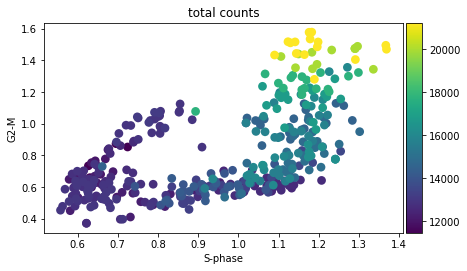



 8305C_THYROID_proc.h5ad


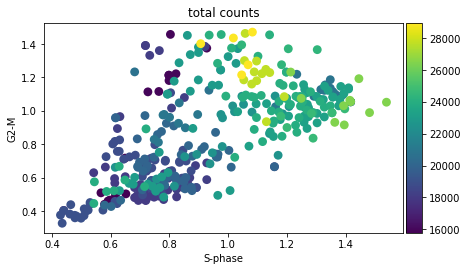



 93VU_UPPER_AERODIGESTIVE_TRACT_proc.h5ad


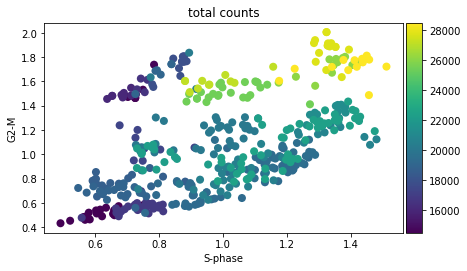



 C32_SKIN_proc.h5ad


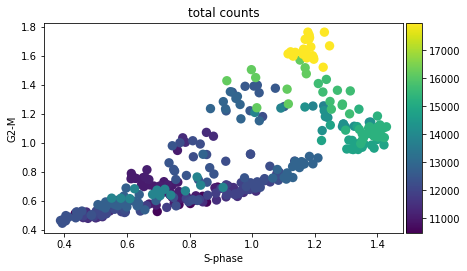



 CHLA10_proc.h5ad


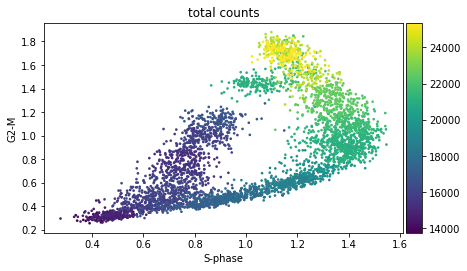



 CHLA9_proc.h5ad


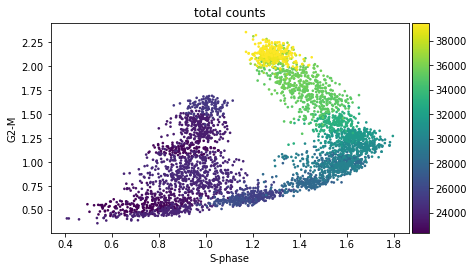



 COLO680N_OESOPHAGUS_proc.h5ad


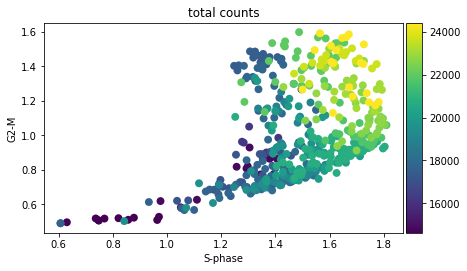



 HELA_KO_proc.h5ad


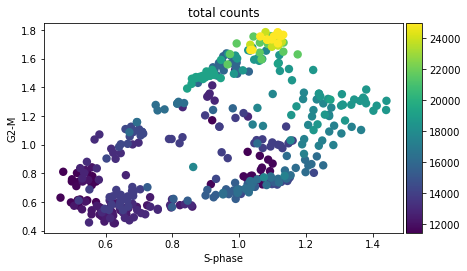



 HELA_WT_proc.h5ad


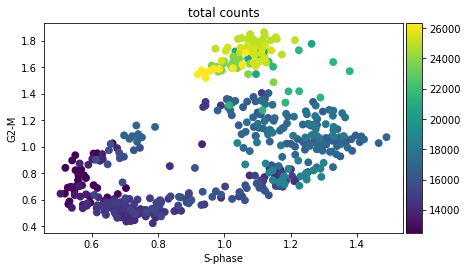



 HOS_BONE_proc.h5ad


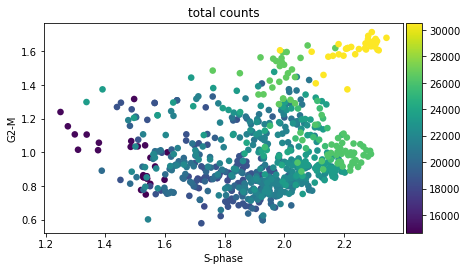



 JHU011_UPPER_AERODIGESTIVE_TRACT_proc.h5ad


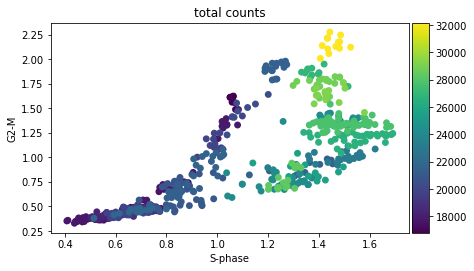



 JHU029_UPPER_AERODIGESTIVE_TRACT_proc.h5ad


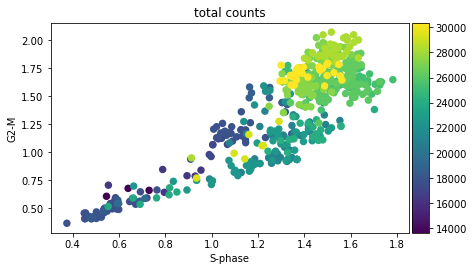



 LS180_LARGE_INTESTINE_proc.h5ad


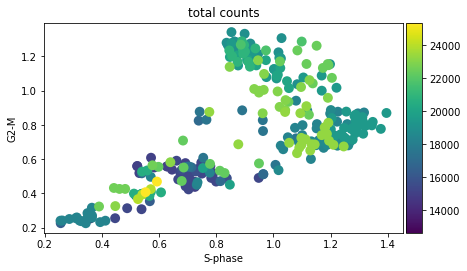



 NCIH1299_LUNG_proc.h5ad


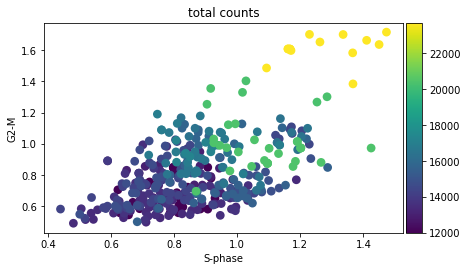



 NCIH2110_LUNG_proc.h5ad


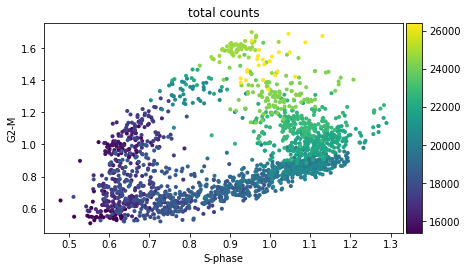



 NCIH2228_LUNG_proc.h5ad


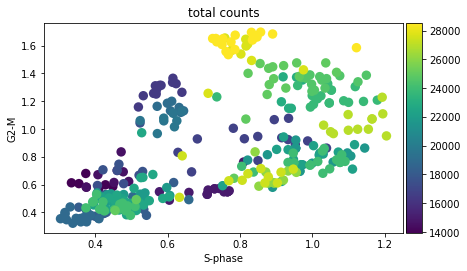



 NCIH2452_PLEURA_proc.h5ad


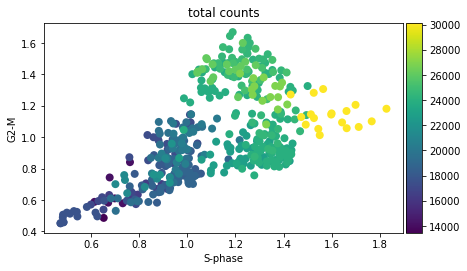



 PANC0203_PANCREAS_proc.h5ad


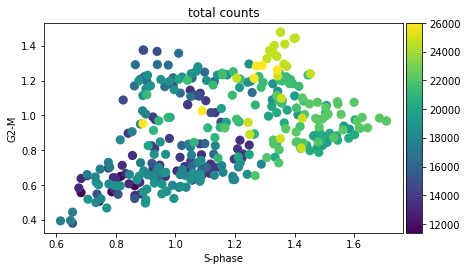



 RERFLCAI_LUNG_proc.h5ad


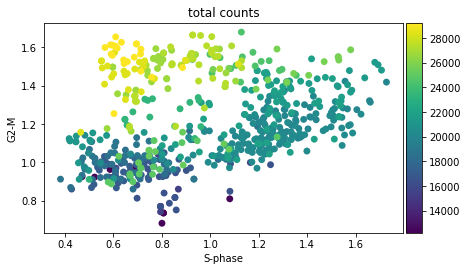



 SCC25_UPPER_AERODIGESTIVE_TRACT_proc.h5ad


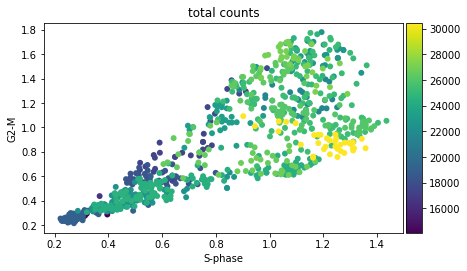



 SCC47_UPPER_AERODIGESTIVE_TRACT_proc.h5ad


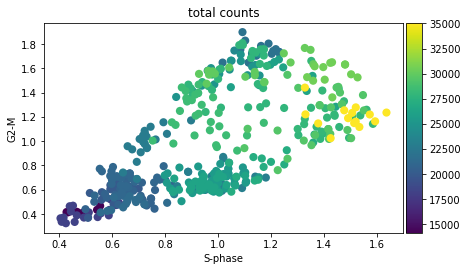



 SCC9_UPPER_AERODIGESTIVE_TRACT_proc.h5ad


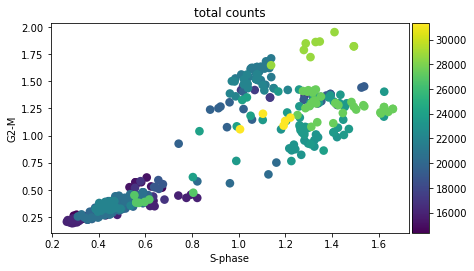



 SH10TC_STOMACH_proc.h5ad


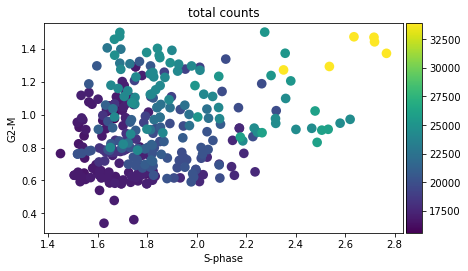



 SNUC4_LARGE_INTESTINE_proc.h5ad


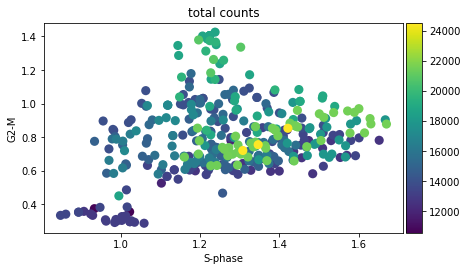



 TC71_proc.h5ad


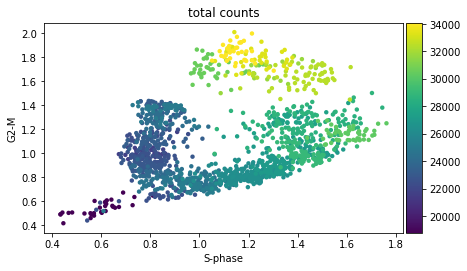



 TE6_OESOPHAGUS_proc.h5ad


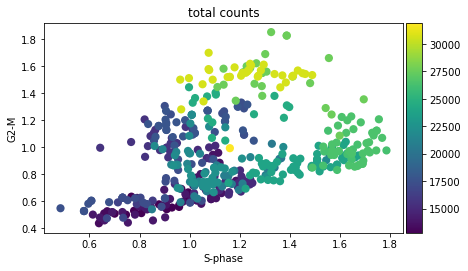



 VMCUB1_URINARY_TRACT_proc.h5ad


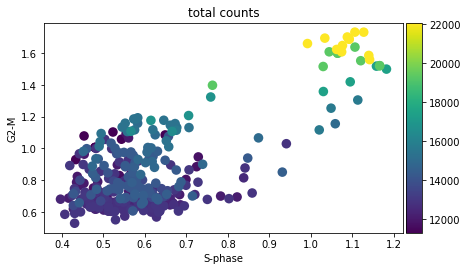



 Y79_proc.h5ad


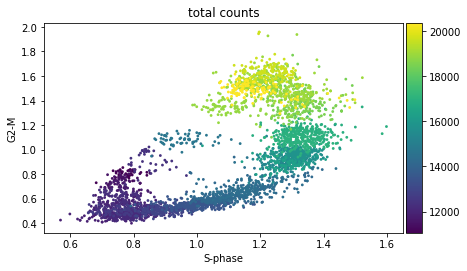



 YD38_UPPER_AERODIGESTIVE_TRACT_proc.h5ad


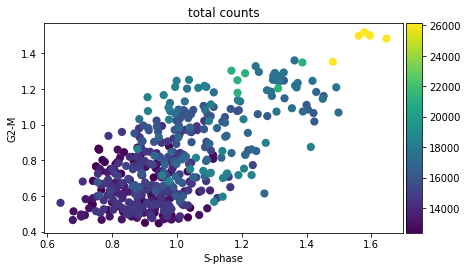

In [5]:
# renormalization and re-computing ica, and saving the results 

files = [f for f in listdir(folder) if (isfile(join(folder, f)))&('_proc.h' in f)&(f.endswith('.h5ad'))&(not 'renorm' in f)]
print('Found ',len(files),'files:',files)

#files = ['CHLA10_proc.h5ad','TC71_proc.h5ad','Y79_proc.h5ad']
#files = ['CHLA9_proc.h5ad']
#files = ['CHLA10_proc.h5ad']
#files = ['TC71_proc.h5ad']
#files = ['HELA_KO_proc.h5ad']
#files = ['Y79_proc.h5ad']

r2_threshold = 0.4
recompute_files = False
cell_cycle_genes = [x.strip() for x in open('cell_cycle_genes_reactome_extended.txt')]
thresh=3

for fname in files:
    print('\n\n===========================\n',fname)
    adata_k = sc.read_h5ad(folder+fname)
    fname_out = folder+fname[:-10]+'_renorm_proc.h5ad'
    if (not path.exists(fname_out))|recompute_files:
        #number_of_nodes=np.min([np.max([np.sqrt(adata_k.X.shape[0]),20]),50])
        number_of_nodes=30
        print('Number of nodes used =',number_of_nodes)
        adata_k.var_names_make_unique()
        adata_k_raw = sc.read_h5ad(folder+fname[:-10]+'_raw.h5ad')
        adata_k_raw.var_names_make_unique()
        #X_elpigraph_training = adata_k.obs[['S-phase','G2-M','G2-M-','Histone_IC']].to_numpy().astype(np.float64)
        #X_elpigraph_training = adata_k.obs[['S-phase','G2-M','Histone_IC']].to_numpy().astype(np.float64)
        #X_elpigraph_training = adata_k.obs[['S-phase','G2-M']].to_numpy().astype(np.float64)
        #X_elpigraph_training = adata_k.obs[['S-phase','G2-M']].to_numpy().astype(np.float64)
        #compute_IC_scores(adata_k)
        #cc_ics = get_relevant_components(adata_k,cell_cycle_genes,mlog10pval_threshold=10)
        #if len(cc_ics)<2:
        #    print('WARNING: less than 2 cell cycle-related ICs is found!',cc_ics)
        #    print('WARNING: reducing the selection stringency...')
        #    cc_ics = get_relevant_components(adata_k,cell_cycle_genes,mlog10pval_threshold=6)
        #print('Dimensionality of cell cycle space:',len(cc_ics))
        cc_dims = get_cell_cycle_subspace(adata_k)
        print('Dimensionality of cell cycle space:',len(cc_dims),cc_dims)
        X_elpigraph_training = adata_k.obs[cc_dims].to_numpy().astype(np.float64)
        
        egr = elpigraph.computeElasticPrincipalCircle(X_elpigraph_training,number_of_nodes,Mu=0.2)
        partition, dists = elpigraph.src.core.PartitionData(X = X_elpigraph_training, NodePositions = egr[0]['NodePositions'], 
                                                            MaxBlockSize = 100000000, TrimmingRadius = np.inf,
                                                            SquaredX = np.sum(X_elpigraph_training**2,axis=1,keepdims=1))
        adata_k.obs['partition'] = partition


        Xtemp = adata_k.X
        cc.tl.subtract_cc(adata_k)
        adata_k.X = Xtemp
        r2scores = adata_k.var['r2_scores']
        ind = np.where(r2scores>r2_threshold)[0]
        adata_k.uns['cc_genes'] = list(adata_k.var_names[ind])

        #compute_self_consistent_principal_circle(adata_k,r2_threshold=r2_threshold,
        #                                         number_of_nodes=number_of_nodes,
        #                                         number_of_pc_components=5)
        #partition = adata_k.obs['partition']

        #print(len(adata_k),len(adata_k_raw))
        #plt.scatter(X_elpigraph_training[:,0],X_elpigraph_training[:,1],c=partition)

        renormalize_by_partition_simplified(adata_k_raw,partition)

        sc.pp.calculate_qc_metrics(adata_k_raw, percent_top=None, log1p=False, inplace=True)  
        sc.pl.violin(adata_k_raw, ['total_counts'], jitter=0.4)

        cc.pp.prep_pooling(adata_k_raw,min_counts=0,max_counts=5000000,n_neighbors=5,
                           normalize_counts=False)

        adata_k_raw.uns['cc_genes'] = adata_k.uns['cc_genes']
        adata_k_raw.uns['scycle'] = adata_k.uns['scycle']
        adata_k_raw.varm['P_dimRed'] = adata_k.varm['P_dimRed']
        adata_k_raw.obs['partition'] = adata_k.obs['partition']
        adata_k = adata_k_raw    
        adata_k_cc = adata_k[:,list(set(adata_k_raw.uns['cc_genes'])&set(adata_k.var_names))]

        sc.tl.pca(adata_k,n_comps=2)
        sc.pl.pca(adata_k,color='total_counts')
        #sc.tl.pca(adata_k_cc,n_comps=2)
        #sc.pl.pca(adata_k_cc,color='total_counts')
        compute_ica(adata_k)

        S_matrix = adata_k.varm['P_dimRed'].T
        Metagenes = pd.DataFrame(S_matrix, columns = list(adata_k.var_names), index = ['IC'+ str(i+1) for i in range(S_matrix.shape[0])])
        MetagenesT = Metagenes.transpose()
        MetagenesT.insert(0, "GENE", list(adata_k.var_names), True) 
        MetagenesT.to_csv(folder+fname[:-10]+'_S.xls',sep='\t',index=False)

        adata_k.write_h5ad(fname_out,compression='gzip')
        print(fname,'===========================\n\n')
    else:
        adata_k = sc.read_h5ad(fname_out)
        S_matrix = adata_k.varm['P_dimRed'].T
        Metagenes = pd.DataFrame(S_matrix, columns = list(adata_k.var_names), index = ['IC'+ str(i+1) for i in range(S_matrix.shape[0])])
        MetagenesT = Metagenes.transpose()
        MetagenesT.insert(0, "GENE", list(adata_k.var_names), True) 
        MetagenesT.to_csv(folder+fname[:-9]+'_S.xls',sep='\t',index=False)
        sc.pl.scatter(adata_k,x='S-phase',y='G2-M',color='total_counts')
    


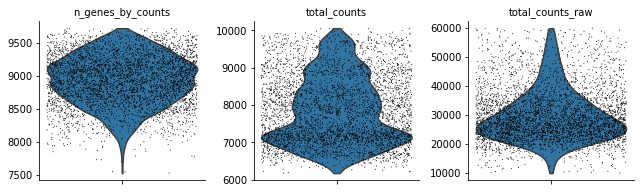

Number of markers= 34


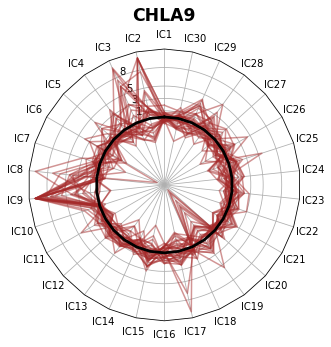

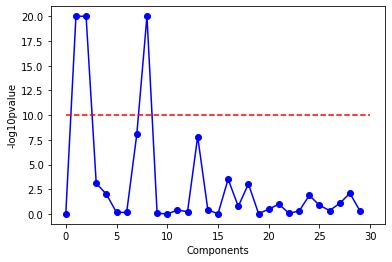

Cell cycle-enriched components: ['IC2', 'IC3', 'IC9']
{'dimRed': {'features': array(['MALAT1', 'MT-CO2', 'MT-CO1', ..., 'CIART', 'KTN1-AS1', 'CCDC30'],
      dtype=object), 'method': 'ica', 'n_comps': 30}, 'enrich_components': {'G1S': 2, 'G1S_score': 7.052999299063069, 'G2M+': 8, 'G2M+_score': 10.20548440547806, 'G2M-': 7, 'G2M-_score': 5.361156166995351, 'Histone': 1, 'Histone_score': 19.5984651118837}, 'preprocess': {'division_factor': 1, 'embed_n_comps': 20, 'filter_var_genes': True, 'log_transform': True, 'max_counts': 500000, 'max_mt_ratio': 20, 'method': 'pooling', 'min_counts': 0, 'n_neighbors': 5, 'n_top_genes': 10000, 'normalize_counts': True}}


In [6]:
cell_line = 'CHLA9'
#cell_line = 'CHLA10'
#cell_line = 'TC71'
#cell_line = 'HELA_KO'
#cell_line = 'NCIH2110_LUNG'
#cell_line = 'HMC18_BREAST'
#cell_line = 'SNUC4_LARGE_INTESTINE'
#cell_line = 'HEC59_ENDOMETRIUM'
#cell_line = 'JHU011_UPPER_AERODIGESTIVE_TRACT'
#cell_line = 'JHU011_UPPER_AERODIGESTIVE_TRACT'
#cell_line = 'IGR1_SKIN'
#cell_line = 'C32_SKIN'
#cell_line = 'A375_SKIN'
#cell_line = 'SCC25_UPPER_AERODIGESTIVE_TRACT'
#cell_line = 'Y79'
#cell_line = 'HELA_WT'

## Part 2: cell-cycle associated components
#adata = sc.read_h5ad(folder+'TC71_renorm_proc.h5ad')
#adata = sc.read_h5ad(folder+'JHU011_UPPER_AERODIGESTIVE_TRACT_renorm_proc.h5ad')

#adata = sc.read_h5ad(folder+cell_line+'_proc.h5ad')
#adata.obs['total_counts_raw'] = adata.obs['total_counts']
#adata = sc.read_h5ad('CHLA9_renorm_proc.h5ad')
adata = sc.read_h5ad(folder+cell_line+'_renorm_proc.h5ad')


sc.pp.calculate_qc_metrics(adata, percent_top=None, log1p=False, inplace=True)
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts','total_counts_raw'],
             jitter=0.4, multi_panel=True)

S_matrix = adata.varm['P_dimRed']
#inds = np.isin(adata.var_names,all_markers)
Metagenes = pd.DataFrame(S_matrix.T, columns = list(adata.var_names), index = ['IC'+ str(i+1) for i in range(S_matrix.T.shape[0])])
MetagenesT = Metagenes.transpose()
MetagenesT.insert(0, "GENE", list(adata.var_names), True) 
MetagenesT.to_csv(cell_line+'_S.xls',sep='\t',index=False)


all_markers = cc.data._cc_markers.g2m_markers+cc.data._cc_markers.g1s_markers+cc.data._cc_markers.g2m_inhibitory_markers+cc.data._cc_markers.histone_markers
#freeman_G1S = ['ADAMTS1','ASF1B','ATAD2','BARD1','BLM','BRCA1','BRIP1','C17orf75','C9orf40','CACYBP','CASP8AP2','CCDC15','CCNE1','CCNE2','CCP110','CDC25A','CDC45','CDC6','CDC7','CDK2','CDT1','CENPJ','CENPQ','CENPU','CEP57','CHAF1A','CHAF1B','CHEK1','CLSPN','CREBZF','CRYL1','CSE1L','DCLRE1B','DCTPP1','DEK','DERA','DHFR','DNA2','DNAJC9','DNMT1','DONSON','DSCC1','DSN1','DTL','E2F8','EED','EFCAB11','ENDOD1','ETAA1','EXO1','EYA2','EZH2','FAM111A','FANCE','FANCG','FANCI','FANCL','FBXO5','FEN1','GGH','GINS1','GINS2','GINS3','GLMN','GMNN','GMPS','GPD2','HADH','HELLS','HSF2','ITGB3BP','KIAA0101','KNTC1','LIG1','MCM10','MCM2','MCM3','MCM4','MCM5','MCM6','MCM7','MCMBP','METTL9','MMD','MNS1','MPP1','MRE11A','MSH2','MSH6','MYO19','NASP','NPAT','NSMCE4A','ORC1','OSGEPL1','PAK1','PAQR4','PARP2','PASK','PAXIP1','PBX3','PCNA','PKMYT1','PMS1','POLA1','POLA2','POLD3','POLE2','PRIM1','PRPS2','PSMC3IP','RAB23','RAD51','RAD51AP1','RAD54L','RBBP8','RBL1','RDX','RFC2','RFC3','RFC4','RMI1','RNASEH2A','RPA1','RRM1','RRM2','SLBP','SLC25A40','SMC2','SMC3','SSX2IP','SUPT16H','TEX30','TFDP1','THAP10','THEM6','TIMELESS','TIPIN','TMEM106C','TMEM38B','TRIM45','TRIP13','TSPYL4','TTI1','TUBGCP5','TYMS','UBR7','UNG','USP1','WDHD1','WDR76','WRB','YEATS4','ZBTB14','ZWINT']
#freeman_G2M = ['ADGRE5','ARHGAP11A','ARHGDIB','ARL6IP1','ASPM','AURKA','AURKB','BIRC5','BORA','BRD8','BUB1','BUB1B','BUB3','CCNA2','CCNB1','CCNB2','CCNF','CDC20','CDC25B','CDC25C','CDC27','CDCA3','CDCA8','CDK1','CDKN1B','CDKN3','CENPE','CENPF','CENPI','CENPN','CEP55','CEP70','CEP85','CKAP2','CKAP5','CKS1B','CKS2','CTCF','DBF4','DBF4B','DCAF7','DEPDC1','DLGAP5','ECT2','ERCC6L','ESPL1','FAM64A','FOXM1','FZD2','FZD7','FZR1','GPSM2','GTF2E1','GTSE1','H2AFX','HJURP','HMGB2','HMGB3','HMMR','HN1','INCENP','JADE2','KIF11','KIF14','KIF15','KIF18A','KIF18B','KIF20A','KIF20B','KIF22','KIF23','KIF2C','KIF4A','KIF5B','KIFC1','KPNA2','LBR','LMNB2','MAD2L1','MELK','MET','METTL4','MIS18BP1','MKI67','MPHOSPH9','MTMR6','NCAPD2','NCAPG','NCAPG2','NCAPH','NDC1','NDC80','NDE1','NEIL3','NEK2','NRF1','NUSAP1','OIP5','PAFAH2','PARPBP','PBK','PLEKHG3','PLK1','PLK4','PRC1','PRR11','PSRC1','PTTG1','PTTG3P','RACGAP1','RAD21','RASSF1','REEP4','SAP30','SHCBP1','SKA1','SLCO1B3','SOGA1','SPA17','SPAG5','SPC25','SPDL1','STIL','STK17B','TACC3','TAF5','TBC1D2','TBC1D31','TMPO','TOP2A','TPX2','TROAP','TTF2','TTK','TUBB4B','TUBD1','UBE2C','UBE2S','VANGL1','WEE1','WHSC1','XPO1','ZMYM1']
#all_markers = freeman_G1S+freeman_G2M
#cell_cycle_genes = [x.strip() for x in open('regev_lab_cell_cycle_genes.txt')]
#all_markers = cell_cycle_genes

#g1s_markers = cell_cycle_genes[:43]
#g2m_markers = cell_cycle_genes[43:]

#all_markers = histone_markers
g1s_markers = cc.data._cc_markers.g1s_markers
g2m_markers = cc.data._cc_markers.g2m_markers 
g2m_inh_markers = cc.data._cc_markers.g2m_inhibitory_markers
histone_markers = cc.data._cc_markers.histone_markers

sc.pp.highly_variable_genes(adata,n_top_genes=1000,n_bins=20)
ind_genes2k = np.where(adata.var['highly_variable'])[0]
adata2k = adata[:,ind_genes2k]
all_markers_sel = list(set(adata2k.var_names)&set(all_markers))
inds = np.isin(adata.var_names,all_markers_sel)


print('Number of markers=',np.sum(inds))

prof = S_matrix[inds,:]
#prof = np.mean(prof,axis=0)
prof[prof<-10]=-10
prof[prof>10]=10
d = prof

colors = ['b', 'r', 'g', 'm', 'y', 'grey','olive']*20

N = 30
spoke_labels = ['IC'+str(i) for i in range(1,31)]
theta = radar_factory(N, frame='polygon')

color = 'r'

fig, axs = plt.subplots(figsize=(5, 5), nrows=1, ncols=1,
                        subplot_kw=dict(projection='radar'))
axs.set_rgrids([1, 3, 5, 8])
axs.set_varlabels(spoke_labels)


for i in range(d.shape[0]):
    #axs.plot(theta, d[i,:], color=colors[i])
    if all_markers_sel[i] in g1s_markers:
        axs.plot(theta, d[i,:], color='brown', alpha=0.5)
    if all_markers_sel[i] in g2m_markers:
        axs.plot(theta, d[i,:], color='brown', alpha=0.5)
    if all_markers_sel[i] in histone_markers:
        axs.plot(theta, d[i,:], color='brown', alpha=0.5)
    if all_markers_sel[i] in g2m_inh_markers:
        axs.plot(theta, d[i,:], color='brown', alpha=0.5)


    #axs.title()
#axs.fill(theta, d, facecolor=color, alpha=0.25)

axs.plot(theta, [0]*d.shape[1], color='k')
axs.plot(theta, [0.1]*d.shape[1], color='k')
axs.plot(theta, [-0.1]*d.shape[1], color='k')

#axs.plot(theta, d, color=colors[i])
#axs.fill(theta, d, facecolor=color, alpha=0.25)
#plt.title(cell_line,fontsize=20)
axs.set_title(cell_line.split('_')[0], weight='bold', size='xx-large', position=(0.5, 1.1),
                     horizontalalignment='center', verticalalignment='center')
plt.savefig('radar.png',dpi=400)
plt.show()

cell_cycle_genes = [x.strip() for x in open('cell_cycle_genes_reactome_extended.txt')]
cc_assoc_comps_idx = find_enriched_components(adata,cell_cycle_genes,plot=True,mlog10pval_threshold=10)
print('Cell cycle-enriched components:',['IC'+str(comp+1) for comp in list(cc_assoc_comps_idx)])

print(adata.uns['scycle'])

In [122]:
compute_ica(adata)    
adata.write_h5ad(folder+cell_line+'_proc.h5ad',compression='gzip')

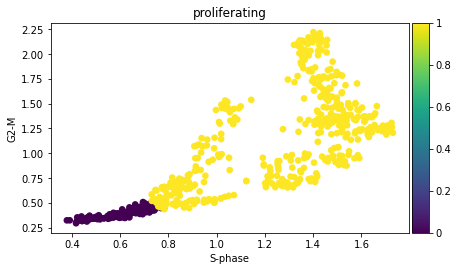

The initial number of nodes must be at least 3. This will be fixed
Generating the initial configuration
Creating a circle in the plane induced by the 1st and 2nd PCs with 3 nodes
90% of the points have been used as initial conditions. Resetting.
Constructing tree 1 of 1 / Subset 1 of 1
Performing PCA
Using standard PCA
2 dimensions are being used
100.0 % of the original variance has been retained
The elastic matrix is being used. Edge configuration will be ignored
Computing EPG with  20.199009876724155  nodes on  472  points and  2  dimensions
Nodes =  3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 

BARCODE	ENERGY	NNODES	NEDGES	NRIBS	NSTARS	NRAYS	NRAYS2	MSE	MSEP	FVE	FVEP	UE	UR	URN	URN2	URSD

0||21	0.029	21	21	21	0	0	0	0.011	0.0093	0.9634	0.9692	0.0052	0.0127	0.2675	5.618	0


MSDEnergyPlot not yet implemented
accuracyComplexityPlot not yet implemented
0.354  seconds elapsed


Iteration 0 Fraction of non-proliferating cells: 0.29525222551928787 





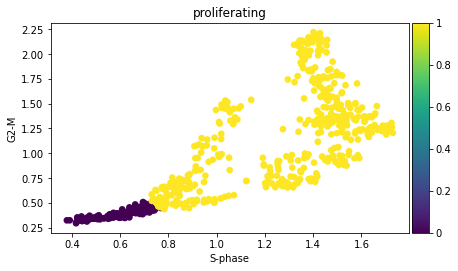

In [88]:
find_nonproliferative_cells(adata,number_of_sigmas=2)
sc.pl.scatter(adata,x='S-phase',y='G2-M',color='proliferating')

In [172]:
signature_dict = {}

IC_EwS_genes = ['CD99','TMEM98','JARID2','AASS','IGF1','IKZF2','DAPK2','TNC','BARX2','ZIC2','ADRB1','LMO3','PTGER3','ALX4','CDK14','CTTNBP2','ACTN2','N4BP2','ITM2A','PKP1','CADPS2','CEACAM6','RCOR1','EFNB1','GLG1','CREM','H2AFY2','DNAL4','ATP11C','PCDH11X','FCGRT','DLX5','CAV2','CAV1','CPVL','TSPAN13','SPATA6L','CDC37L1','SH3PXD2A','EBF3','DNAJC12','CCND1','RNF141','SOX6','SH2B3','WASF1','FAM46A','MAN2A1','C7','HES1','FN1','ID2','EPHA4','OLFML3','KMO','PADI2','TXNIP','AKAP7','OLFM3','KDSR','YPEL5','KIAA1217','NPY','EGR2','ZC3H13','NCKAP1L','NMI','TNFAIP6','PARD6B','COL21A1','PCSK2','BCL11B','TSPAN8','TUBA4A','HOXD13','TRPM4','OLFM1','SYT4','TPTE2','GSTM1','SYT6','HOOK1','ANXA1','CAPRIN1','MYC','CPEB2','SLCO5A1','TGS1','FAM117B','GLCE','NDST4','DUSP6','WDFY2','SLAIN1','SORD','CDH11','IFITM3','RERE','HMCN1','RGL1','SCN1A','MARCH1','MYO10','BDP1','TENM2','DCDC2','PRSS35','NLGN4X','TMEM47','AK3','CER1','LRRC4C','FADS1','CDH8','DLG2','FLI1','KCNE4','UHMK1','LONRF1','APCDD1','DKK2','SLC26A2','GDF6','STEAP2','FZD1','KIT','ADAMTS4','CACHD1','EPB41','CSRP1','PRAC','JAK1','RAVER2','NTNG1','CLDN1','ATP1A1','ABHD6','NPY1R','NPY5R','STEAP1','ZNF704','CCDC171','OTUD1','FAM123A','KIAA1462','CACNB2','CYYR1','MFAP4','PRKCB','FAM111A','LOXHD1','RHOH','GFRA2','UGT3A2','FAM84B','GSTM4','ZEB2','LDB2','PCDH7','CHD3','FOS','DLGAP1','GSTA4','MLLT3','ADRA1D','ID4','SLFN11','MYEOV','GLRX','DAB1','SMARCC1','GPR64','NET1','FZD4','CALCB','HOXD8','JAKMIP2','SNX18','SLC17A8','ALX1','TSPYL5','PENK','PAPPA','LHFP','NELL2','ROBO2','FLRT2','RBM11','PBX1','IFITM1','IRS2','WWOX','TRDN','CCK','FNBP1','DCC','LIPI','IL1RAP','AKR1C3','FAT4','MMP1','DAPK1','ENPP1','FAM49A','SIRPA','PAX9','CES1','DCLRE1A','NPTXR','RP13-16H11.2','AC022311.1','RP13-16H11.1','AC073135.3','KIAA1456','RP11-6C14.1','RP11-1258F18.1','RP11-521M14.1','TRAV1-2','RP11-252A24.7','RP11-18I14.10']
signature_dict['IC_EwS'] = IC_EwS_genes

for i in range(adata.varm['P_dimRed'].shape[1]):
    genes = adata.uns['scycle']['dimRed']['features'][adata.varm['P_dimRed'][:,i]>3]
    signature_dict['IC'+str(i+1)] = genes
sc.pp.highly_variable_genes(adata,n_top_genes=2001,n_bins=20)
ind_genes2k = np.where(adata.var['highly_variable'])[0]
adata2k = adata[:,ind_genes2k]
scores_dic = calc_scores(adata2k,signature_dict)
for score in scores_dic:
    adata.obs[score] = scores_dic[score]

In [164]:
#sc.pl.scatter(adata,x='IC2',y='IC9',color='total_counts')

Dimensionality of the cell cycle space= 3
number_of_nodes= 21.79449471770337
The initial number of nodes must be at least 3. This will be fixed
Generating the initial configuration
Creating a circle in the plane induced by the 1st and 2nd PCs with 3 nodes
90% of the points have been used as initial conditions. Resetting.
Constructing tree 1 of 1 / Subset 1 of 1
Performing PCA
Using standard PCA
3 dimensions are being used
100.0 % of the original variance has been retained
The elastic matrix is being used. Edge configuration will be ignored
Computing EPG with  10  nodes on  475  points and  3  dimensions
Nodes =  3 4 5 6 7 8 9 

BARCODE	ENERGY	NNODES	NEDGES	NRIBS	NSTARS	NRAYS	NRAYS2	MSE	MSEP	FVE	FVEP	UE	UR	URN	URN2	URSD

0||10	0.095	10	10	10	0	0	0	0.0388	0.0346	0.9066	0.9166	0.0094	0.0468	0.468	4.6801	0


MSDEnergyPlot not yet implemented
accuracyComplexityPlot not yet implemented
0.0425  seconds elapsed


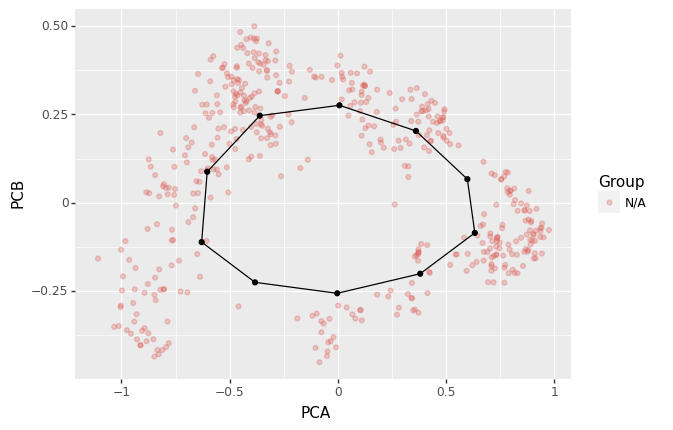

[<ggplot: (8764097083529)>]
Constructing tree 1 of 1 / Subset 1 of 1
Performing PCA
Using standard PCA
3 dimensions are being used
100.0 % of the original variance has been retained
Computing EPG with  21.79449471770337  nodes on  475  points and  3  dimensions
Nodes =  9 10 11 12 13 14 15 16 17 18 19 20 21 

BARCODE	ENERGY	NNODES	NEDGES	NRIBS	NSTARS	NRAYS	NRAYS2	MSE	MSEP	FVE	FVEP	UE	UR	URN	URN2	URSD

0||22	0.0217	22	21	20	0	0	0	0.0135	0.0116	0.9676	0.972	0.0005	0.0078	0.1708	3.7579	0


MSDEnergyPlot not yet implemented
accuracyComplexityPlot not yet implemented
0.1306  seconds elapsed


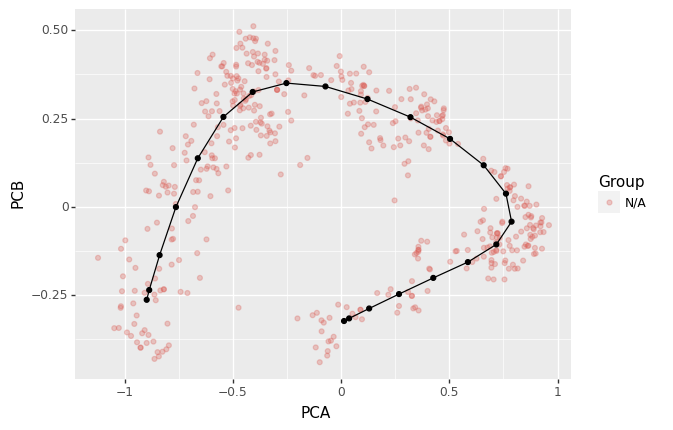

[<ggplot: (8764094359065)>]
Starting node= -1


In [92]:
#cc_coords = ['S-phase','G2-M','G2-M-','Histone_IC']
#cc_coords = ['S-phase','G2-M','Histone_IC']
#cc_coords = ['S-phase','G2-M']
#compute_IC_scores(adata)
cc_ccords = get_relevant_components(adata,cell_cycle_genes)
print('Dimensionality of the cell cycle space=',len(cc_ccords))

#cc_coords = ['IC2','IC3','IC13','IC17']
#cc_coords = ['IC2','IC3','IC13','IC17','IC18','IC26']
X_elgr = adata.obs[cc_coords].to_numpy().astype(np.float64)
X_elgr_prolif = X_elgr[adata.obs['proliferating'],:]
number_of_nodes=np.min([np.max([np.sqrt(X_elgr_prolif.shape[0]),20]),50])
print('number_of_nodes=',number_of_nodes)
egr,sn = compute_principal_curve_from_circle(X_elgr_prolif,n_nodes=number_of_nodes,Lambda=0.001,Mu=0.5)
print('Starting node=',sn)


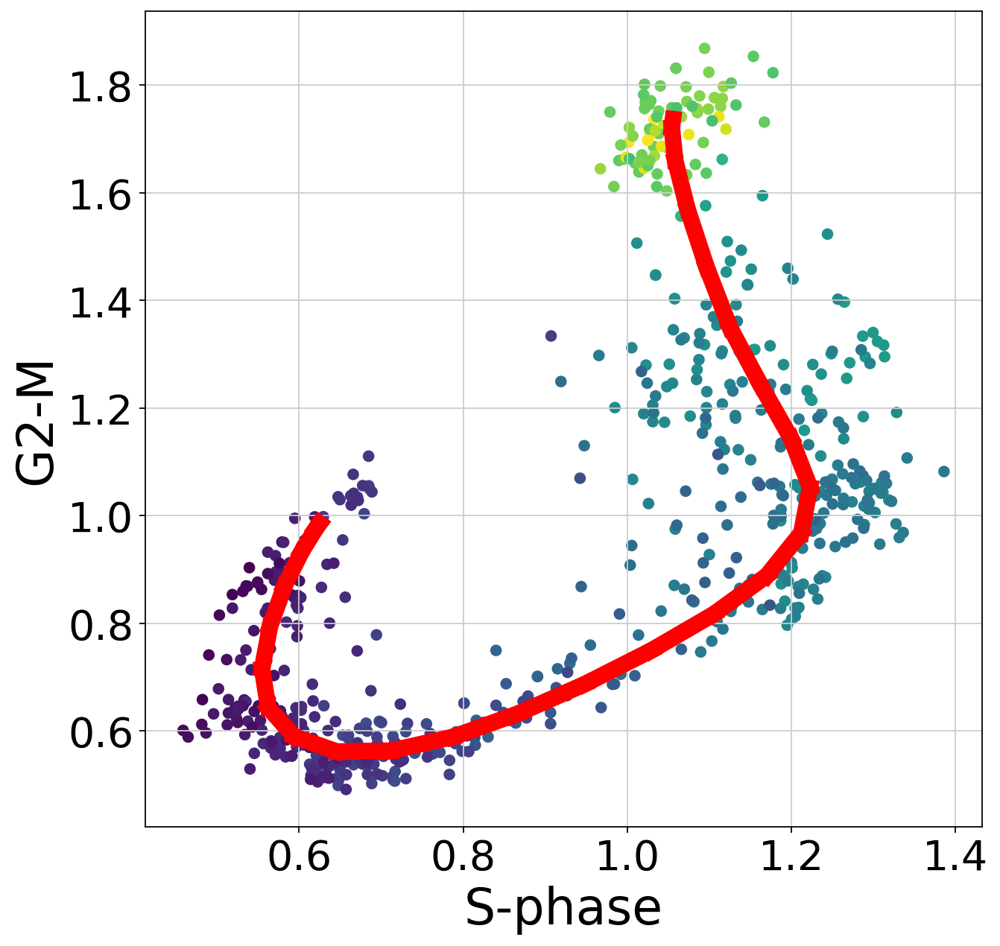

In [159]:
ax_x = 'S-phase'
#ax_y = 'Histone_IC'
ax_y = 'G2-M'
#ax_x = 'G2-M'
#ax_y = 'G2-M-'

#ax_x = 'IC3'
#ax_y = 'IC13'
idx_x = cc_coords.index(ax_x)
idx_y = cc_coords.index(ax_y)
nodep = egr[0]['NodePositions']
edges = egr[0]['Edges'][0]
ind_prolif = adata.obs['proliferating']
ind_prolif_not = ~adata.obs['proliferating']
plt.figure(figsize=(9,9))
plt.scatter(adata.obs[ax_x][ind_prolif],adata.obs[ax_y][ind_prolif],c=adata.obs['total_counts'][ind_prolif])
plt.scatter(adata.obs[ax_x][ind_prolif_not],adata.obs[ax_y][ind_prolif_not],c='grey')

for e in edges:
    plt.plot([nodep[e[0],idx_x],nodep[e[1],idx_x]],[nodep[e[0],idx_y],nodep[e[1],idx_y]],'r-',linewidth=10)
plt.xlabel(ax_x,fontsize=30)
plt.ylabel(ax_y,fontsize=30)
plt.xticks(fontsize=25)
plt.yticks(fontsize=25)
plt.savefig(ax_x+"_"+ax_y+'.png',dpi=300)
plt.show()

[0, 22, 20, 6, 15, 23, 8, 18, 12, 9, 11, 2]


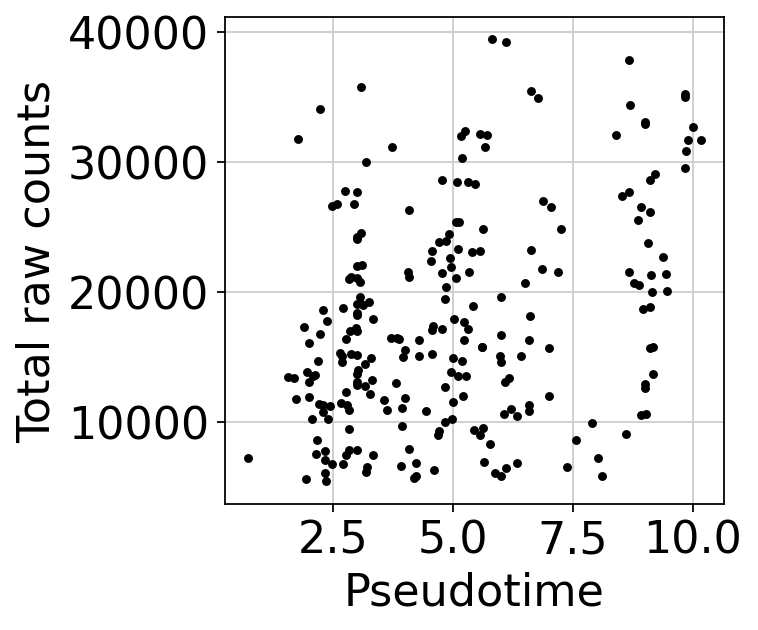

In [161]:
# Compute pseudo-time

gr = egr[0]
starting_node = sn
if starting_node<0:
    starting_node=0
traj = extract_trajectories(gr,starting_node,verbose=False)[0]
print(traj)
ProjStruct = project_on_tree(X_elgr,gr)
PseudoTimeTraj = quantify_pseudotime([traj],ProjStruct,producePlot=False)
points = PseudoTimeTraj[0]['Points'] 
pst = PseudoTimeTraj[0]['Pseudotime']

tcr = np.array(adata.obs['total_counts_raw'])
corr = np.corrcoef(pst,tcr[points])[0,1]
if corr<0:
    traj.reverse()
    PseudoTimeTraj = quantify_pseudotime([traj],ProjStruct,producePlot=False)
    points = PseudoTimeTraj[0]['Points'] 
    pst = PseudoTimeTraj[0]['Pseudotime']

skip_borders = 50
pstc = pst[skip_borders:-skip_borders]
pointsc = points[skip_borders:-skip_borders]
plt.plot(pstc,tcr[pointsc],'k.')
plt.xlabel('Pseudotime',fontsize=20)
plt.ylabel('Total raw counts',fontsize=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.show()

In [77]:
# Curvature analysis

max_dimension = nodep.shape[1]
#max_dimension = 10
scale = 1

#egr = egr_ic
#traj = traj_ic
gr = egr[0]

curv = np.zeros(len(traj))
nodep = gr['NodePositions']
reduced_dimension = np.min([nodep.shape[1],max_dimension])
x_curv, curv, splines = calc_curvature(nodep[traj,0:reduced_dimension],smoothing_factor=5)
x_curv = x_curv[1:-1]
curv = curv[1:-1]
#curv = (curv-np.min(curv))/(np.max(curv)-np.min(curv))
curvature_peaks = np.array(find_peaks(curv))[0]

plt.figure(figsize=(10,5))

#for i in range(max_dimension):
#    plt.plot(range(nodep.shape[0]),nodep[traj,i],'-',alpha=0.2,linewidth=5)

#plt.plot(pst,adata.obs['IC'+str(idx_g1s+1)][points],'r.',label='G1S')
#plt.plot(pst,adata.obs['IC'+str(idx_g2m+1)][points],'g.',label='G2M')
#plt.plot(pst,adata.obs['IC'+str(idx_g2m_inh+1)][points],'b.',label='G2M INH')
#plt.plot(pst,adata.obs['IC'+str(idx_histone+1)][points],'c.',label='HISTONE')
#plt.plot(x_curv,scale*curv/np.max(curv),'ko-',label='Curvature')
plt.plot(x_curv,scale*curv,'ko-',label='Curvature',linewidth=5,markersize=10)
for i in range(curvature_peaks.shape[0]):
    plt.plot([curvature_peaks[i]+1,curvature_peaks[i]+1],
             [np.min(curv),scale*curv[int(curvature_peaks[i])]],
             'k--',linewidth=1.5)
#plt.legend()
plt.xlabel('Pseudotime',fontsize=40)
plt.ylabel('Curvature',fontsize=40)
plt.xticks(fontsize=40)
plt.yticks(fontsize=40)
plt.show()

NameError: name 'nodep' is not defined

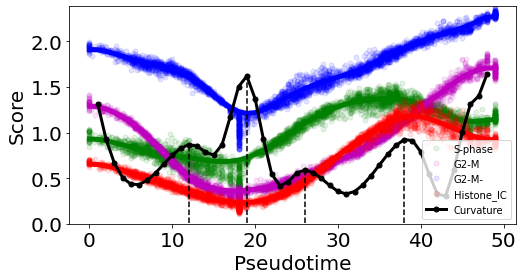

In [83]:
colors = ['g','m','b','r','y','c']

node_vals = nodep.copy()
Xsel = X_elgr.copy()

plot_relative = False
if plot_relative:
    node_vals/=np.max(X_elgr,axis=0)
    Xsel/=np.max(X_elgr,axis=0)
    
plt.figure(figsize=(8,4))
for i,g in enumerate(cc_coords):
    plt.plot(pst[ind_prolif],Xsel[points,i][ind_prolif],colors[i]+'.',label=cc_coords[i],alpha=0.1,markersize=10)
    plt.plot(range(node_vals.shape[0]),node_vals[traj,i],colors[i]+'-',linewidth=5)

scale = 50
plt.plot(x_curv,scale*curv,'ko-',label='Curvature',linewidth=3,markersize=5)
for i in range(curvature_peaks.shape[0]):
    plt.plot([curvature_peaks[i]+1,curvature_peaks[i]+1],
             [np.min(curv),scale*curv[int(curvature_peaks[i])]],
             'k--',linewidth=1.5)
    
plt.ylabel('Score',fontsize=20)
plt.xlabel('Pseudotime',fontsize=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.ylim([0,np.max(X_elgr)])
plt.savefig('4IC.png',dpi=400)
plt.legend()
plt.show()



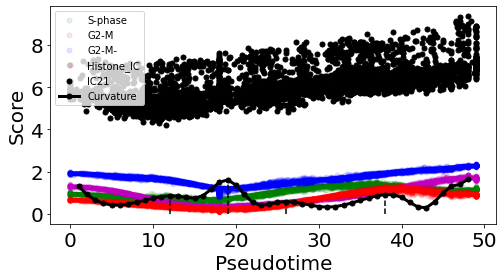

(4221, 1)


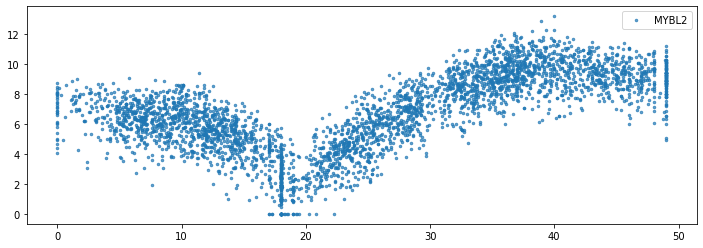

In [90]:
colors = ['g','m','b','r','y','c']

node_vals = nodep.copy()
Xsel = X_elgr.copy()

plot_relative = False
if plot_relative:
    node_vals/=np.max(X_elgr,axis=0)
    Xsel/=np.max(X_elgr,axis=0)
    
plt.figure(figsize=(8,4))
for i,g in enumerate(cc_coords):
    plt.plot(pst[ind_prolif],Xsel[points,i][ind_prolif],colors[i]+'.',label=cc_coords[i],alpha=0.1,markersize=10)
    plt.plot(range(node_vals.shape[0]),node_vals[traj,i],colors[i]+'-',linewidth=5)
    
comp = 'IC21'
EwS = adata.obs[comp]
plt.plot(pst[ind_prolif],EwS[points][ind_prolif],'k.',label=comp,alpha=1,markersize=10)

scale = 50
plt.plot(x_curv,scale*curv,'ko-',label='Curvature',linewidth=3,markersize=5)
for i in range(curvature_peaks.shape[0]):
    plt.plot([curvature_peaks[i]+1,curvature_peaks[i]+1],
             [np.min(curv),scale*curv[int(curvature_peaks[i])]],
             'k--',linewidth=1.5)

    
plt.ylabel('Score',fontsize=20)
plt.xlabel('Pseudotime',fontsize=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
#plt.ylim([0,np.max(X_elgr)])
plt.savefig('4IC.png',dpi=400)
plt.legend()
plt.show()

plt.figure(figsize=(12,4))
#genes = ['PIF1','ID1','DBF4B','CENPVL3']
genes = ['MYBL2']
#genes = ['TAF15']
#genes = ['TSPAN13']
gene_profile = adata[:,genes].X
print(gene_profile.shape)
for i in range(gene_profile.shape[1]):
    plt.plot(pst[ind_prolif],gene_profile[points,i][ind_prolif],'.',alpha=0.7,markersize=5,label=genes[i])
plt.legend()
plt.show()


In [92]:
# Classify genes by their maximal contribution to a cell cycle component
from collections import Counter

adata_cc = adata[:,adata.uns['cc_genes']]
idx_g1s = adata.uns['scycle']['enrich_components']['G1S']
idx_g2m = adata.uns['scycle']['enrich_components']['G2M+']
idx_g2m_inh = adata.uns['scycle']['enrich_components']['G2M-']
idx_histone = adata.uns['scycle']['enrich_components']['Histone']
S_matrix = adata_cc.varm['P_dimRed'][:,[idx_g1s,idx_g2m,idx_g2m_inh,idx_histone]]

class_gene_cc = []
for i,g in enumerate(adata_cc.var_names):
    col = S_matrix[i,:]
    i = np.argmax(col)
    if (g.startswith('HIST'))|(g.startswith('H1'))|(g.startswith('H2'))|(g.startswith('H3'))|(g.startswith('H4')):
        class_gene_cc.append('Histones')
    else:
        if i==0:
            class_gene_cc.append('G1S genes')
        if i==1:
            class_gene_cc.append('G2M genes')
        if i==2:
            class_gene_cc.append('G2M_INH genes')
        if i==3:
            class_gene_cc.append('HIST-IC genes')

adata_cc.var['Class_gene_cc'] = class_gene_cc

print(Counter(class_gene_cc))

Trying to set attribute `.var` of view, copying.


Counter({'G2M genes': 125, 'G1S genes': 69, 'G2M_INH genes': 33, 'Histones': 16, 'HIST-IC genes': 11})


... storing 'Class_gene_cc' as categorical


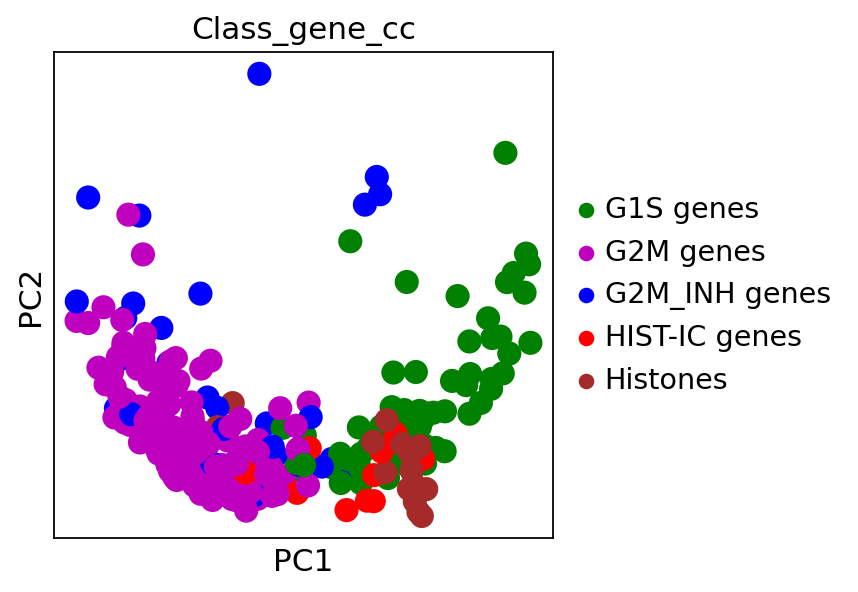

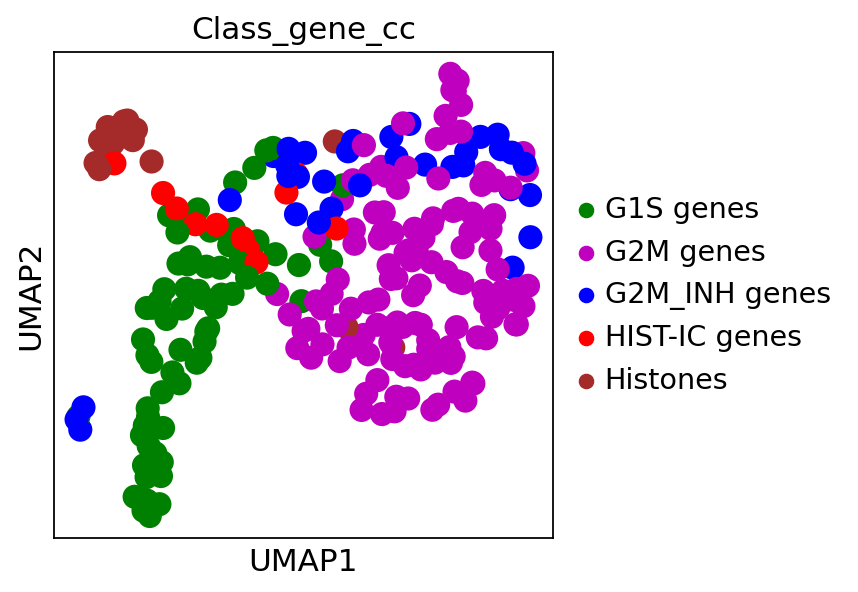

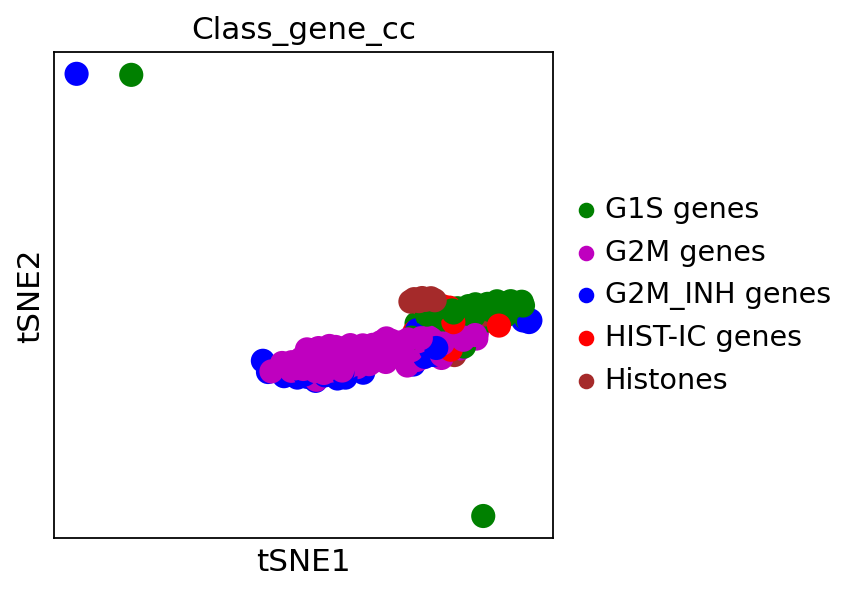

In [93]:
from scipy import stats

sc.set_figure_params(dpi=100)

adata_cc_T = adata_cc.copy().T
Xcc = adata_cc_T.X
Xcc = (stats.zscore(Xcc.T)).T
adata_cc_T.X = Xcc
sc.set_figure_params(dpi=70)
sc.set_figure_params(dpi_save=400)
sc.tl.pca(adata_cc_T,n_comps=10)
sc.pl.pca(adata_cc_T,color='Class_gene_cc',palette=['g','m','b','r','brown'])
sc.pp.neighbors(adata_cc_T, n_neighbors=5)
sc.tl.umap(adata_cc_T)
sc.pl.umap(adata_cc_T,color='Class_gene_cc',palette=['g','m','b','r','brown'],save='UMAP_cc.png')
sc.tl.tsne(adata_cc_T)
sc.pl.tsne(adata_cc_T,color='Class_gene_cc',palette=['g','m','b','r','brown'],save='tSNE_cc.png')

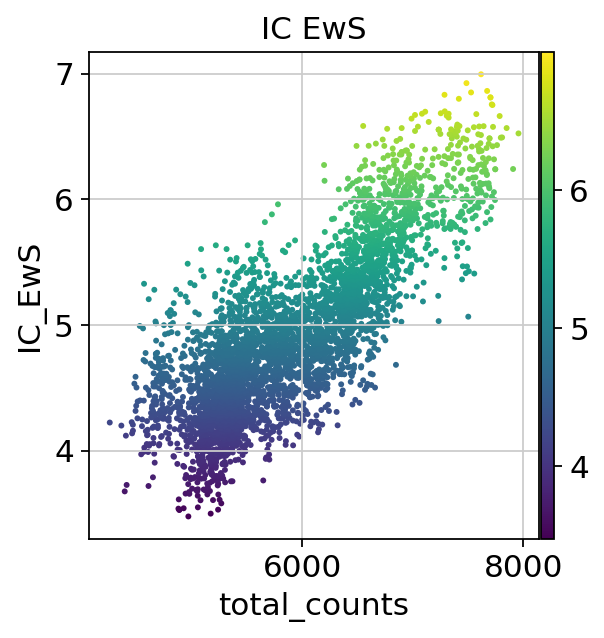

In [94]:
sc.pl.scatter(adata,x='total_counts',y='IC_EwS',color='IC_EwS')

(array([1, 2, 7, 8]),)


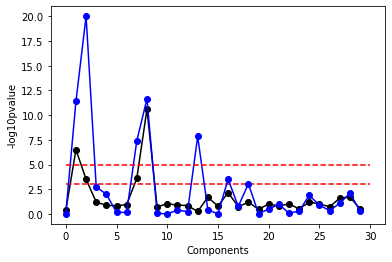

[ 1  2  7  8 13]


In [9]:
# Identify components enriched with cell cycle genes

S_matrix = adata.varm['P_dimRed']

# Approach 1, simple scoring 

thresh = 3

all_markers = cc.data._cc_markers.g2m_markers+cc.data._cc_markers.g1s_markers+cc.data._cc_markers.g2m_inhibitory_markers+cc.data._cc_markers.histone_markers        
inds = np.isin(adata.var_names,all_markers_sel)
prof = S_matrix[inds,:]
#plt.plot(prof)

k = int(prof.shape[0]/2)
mprof = []
for i in range(prof.shape[1]):
    mprof.append(np.mean(-np.sort(-prof[:,i])[0:k]))
plt.plot(mprof,'ko-')
plt.plot([0,S_matrix.shape[1]],[thresh,thresh],'r--')
inds = np.where(np.array(mprof)>thresh)
print(inds)
plt.ylabel('Score')
#plt.show()

# Approach 2, enrichment test

# These are Reactome cell cycle genes
with open("cell_cycle_genes_reactome_extended.txt", "r") as f:
    cell_cycle_genes_reactome = f.readlines()
    cell_cycle_genes_reactome = list(set([s[:-1] for s in cell_cycle_genes_reactome]))

print(find_enriched_components(adata,cell_cycle_genes_reactome,plot=True,mlog10pval_threshold=5))



Found  29 files: ['42MGBA_CENTRAL_NERVOUS_SYSTEM_renorm_proc.h5ad', '8305C_THYROID_renorm_proc.h5ad', '93VU_UPPER_AERODIGESTIVE_TRACT_renorm_proc.h5ad', 'C32_SKIN_renorm_proc.h5ad', 'CHLA10_renorm_proc.h5ad', 'CHLA9_renorm_proc.h5ad', 'COLO680N_OESOPHAGUS_renorm_proc.h5ad', 'HELA_KO_renorm_proc.h5ad', 'HELA_WT_renorm_proc.h5ad', 'HOS_BONE_renorm_proc.h5ad', 'JHU011_UPPER_AERODIGESTIVE_TRACT_renorm_proc.h5ad', 'JHU029_UPPER_AERODIGESTIVE_TRACT_renorm_proc.h5ad', 'LS180_LARGE_INTESTINE_renorm_proc.h5ad', 'NCIH1299_LUNG_renorm_proc.h5ad', 'NCIH2110_LUNG_renorm_proc.h5ad', 'NCIH2228_LUNG_renorm_proc.h5ad', 'NCIH2452_PLEURA_renorm_proc.h5ad', 'PANC0203_PANCREAS_renorm_proc.h5ad', 'RERFLCAI_LUNG_renorm_proc.h5ad', 'SCC25_UPPER_AERODIGESTIVE_TRACT_renorm_proc.h5ad', 'SCC47_UPPER_AERODIGESTIVE_TRACT_renorm_proc.h5ad', 'SCC9_UPPER_AERODIGESTIVE_TRACT_renorm_proc.h5ad', 'SH10TC_STOMACH_renorm_proc.h5ad', 'SNUC4_LARGE_INTESTINE_renorm_proc.h5ad', 'TC71_renorm_proc.h5ad', 'TE6_OESOPHAGUS_renorm_pr

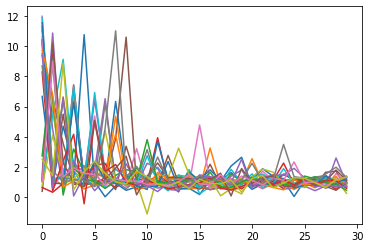

In [11]:
# create a list of cc-enriched components

folder = '/mnt/c/Datas/SingleCellTranscriptomics/Broad_CellLine/cell_lines_umi/'

#files = [f for f in listdir(folder) if (isfile(join(folder, f)))&('_proc' in f)&(f.endswith('.h5ad'))&(not ('renorm' in f))]
files = [f for f in listdir(folder) if (isfile(join(folder, f)))&('_proc' in f)&(f.endswith('.h5ad'))&(('renorm' in f))]
print('Found ',len(files),'files:',files)

cell_cycle_genes = [x.strip() for x in open('cell_cycle_genes_reactome_extended.txt')]

with open('cc_associated_components.txt','w') as fcc:
    for i,fname in enumerate(files):
        print(i,fname)
        adata_k = sc.read_h5ad(folder+fname)
        S_matrix = adata_k.varm['P_dimRed']
        
        #sfile = folder+'/metaanalysis_renormproc/'+fname[:-17]+'_S.xls'
        #df = pd.read_csv(sfile,sep='\t')
        #S_matrix = df[df.columns[1:]].to_numpy()
        #adata_k.varm['P_dimRed'] = S_matrix
        #adata_k.var_names = list(df['GENE'])
        #adata_k.uns['scycle']['dimRed']['features'] = adata_k.var_names
        
        all_markers = cc.data._cc_markers.g2m_markers+cc.data._cc_markers.g1s_markers+cc.data._cc_markers.g2m_inhibitory_markers+cc.data._cc_markers.histone_markers        
        inds = np.isin(adata_k.var_names,all_markers)
        prof = S_matrix[inds,:]
        
        k = int(prof.shape[0]/2)
        mprof = []
        for i in range(prof.shape[1]):
            mprof.append(np.mean(-np.sort(-prof[:,i])[0:k]))
        plt.plot(mprof)
        inds = np.where(np.array(mprof)>2)[0]
        # or
        inds = find_enriched_components(adata_k,cell_cycle_genes,plot=False,mlog10pval_threshold=4)
        
        print(inds)
        for ind in inds:
            #fcc.write('IC'+str(ind+1)+'_'+fname[:-10]+'\n')
            fcc.write('IC'+str(ind+1)+'_'+fname[:-17]+'\n')
            fcc.write('IC'+str(ind+1)+'_'+fname[:-17]+'_\n')
        
        

        

In [10]:
# open all processed files and store cc_genes in a separate gmt file

files = [f for f in listdir(folder) if (isfile(join(folder, f)))&('_renorm' in f)&(f.endswith('.h5ad'))]
print('Found ',len(files),'files:',files)

with open('cc_genes.gmt','w') as f:
    for i,fname in enumerate(files):
        print(i,fname)
        adata_k = sc.read_h5ad(folder+fname)
        cc_genes = adata_k.uns['cc_genes']
        f.write(fname[:-17]+'\tna\t'+'\t'.join(cc_genes)+'\n')

Found  54 files: ['42MGBA_CENTRAL_NERVOUS_SYSTEM_renorm_proc.h5ad', '8305C_THYROID_renorm_proc.h5ad', '93VU_UPPER_AERODIGESTIVE_TRACT_renorm_proc.h5ad', 'A2058_SKIN_renorm_proc.h5ad', 'A375_SKIN_renorm_proc.h5ad', 'BFTC909_KIDNEY_renorm_proc.h5ad', 'C32_SKIN_renorm_proc.h5ad', 'CHLA10_renorm_proc.h5ad', 'CHLA9_renorm_proc.h5ad', 'CL34_LARGE_INTESTINE_renorm_proc.h5ad', 'COLO680N_OESOPHAGUS_renorm_proc.h5ad', 'COLO741_SKIN_renorm_proc.h5ad', 'EFM192A_BREAST_renorm_proc.h5ad', 'HEC59_ENDOMETRIUM_renorm_proc.h5ad', 'HELA_KO_renorm_proc.h5ad', 'HELA_WT_renorm_proc.h5ad', 'HMC18_BREAST_renorm_proc.h5ad', 'HOS_BONE_renorm_proc.h5ad', 'HT1080_SOFT_TISSUE_renorm_proc.h5ad', 'HUH6_LIVER_renorm_proc.h5ad', 'IALM_LUNG_renorm_proc.h5ad', 'IGR1_SKIN_renorm_proc.h5ad', 'IGR37_SKIN_renorm_proc.h5ad', 'JHU006_UPPER_AERODIGESTIVE_TRACT_renorm_proc.h5ad', 'JHU011_UPPER_AERODIGESTIVE_TRACT_renorm_proc.h5ad', 'JHU029_UPPER_AERODIGESTIVE_TRACT_renorm_proc.h5ad', 'LS180_LARGE_INTESTINE_renorm_proc.h5ad', 'N

In [ ]:
# recompute cc genes with different R2

R2_values = [0.1,0.2,0.3,0.4,0.5,0.8]

files = [f for f in listdir(folder) if (isfile(join(folder, f)))&('_renorm' in f)&(f.endswith('.h5ad'))]
print('Found ',len(files),'files:',files)

for r2 in R2_values:
    with open('cc_genes.gmt','w') as f:
        for i,fname in enumerate(files):
            print(i,fname)
            adata_k = sc.read_h5ad(folder+fname)
            cc_genes = adata_k.uns['cc_genes']
            f.write(fname[:-17]+'\tna\t'+'\t'.join(cc_genes)+'\n')

AURKA	1.0	True
KPNA2	1.0	True
CENPF	1.0	True
MKI67	1.0	False
CCNB1	1.0	True
CKS2	0.9814814814814815	False
TPX2	0.9814814814814815	True
ARL6IP1	0.9814814814814815	False
TOP2A	0.9814814814814815	True
CENPA	0.9814814814814815	True
UBE2C	0.9629629629629629	True
PLK1	0.9629629629629629	True
GTSE1	0.9629629629629629	True
HMGB2	0.9444444444444444	False
DEPDC1	0.9444444444444444	False
CENPE	0.9444444444444444	True
NUSAP1	0.9259259259259259	False
CDCA8	0.9259259259259259	True
HMMR	0.9259259259259259	True
NUF2	0.9259259259259259	True
PRC1	0.9074074074074074	False
AURKB	0.9074074074074074	True
KNSTRN	0.9074074074074074	False
ASPM	0.9074074074074074	False
CKAP2	0.9074074074074074	False
CDC20	0.8888888888888888	True
SGOL2	0.8888888888888888	False
HIST1H4C	0.8703703703703703	False
PIF1	0.8703703703703703	False
CDCA3	0.8703703703703703	False
UBE2S	0.8518518518518519	False
BIRC5	0.8518518518518519	True
CCNA2	0.8518518518518519	True
TUBB4B	0.8518518518518519	True
SMC4	0.8333333333333334	True
KIF2C	0.83

SNHG4	0.018518518518518517	False
NFIA	0.018518518518518517	False
BCL11B	0.018518518518518517	False
SLC20A1	0.018518518518518517	False
TEDC2	0.018518518518518517	False
ZNF672	0.018518518518518517	False
CDC25A	0.018518518518518517	True
DNA2	0.018518518518518517	True
CU634019.6	0.018518518518518517	False
ENDOG	0.018518518518518517	False
AL645608.4	0.018518518518518517	False
SNHG21	0.018518518518518517	False
CEP97	0.018518518518518517	False
ATP1B1	0.018518518518518517	False
AC026401.3	0.018518518518518517	False
H2AC15	0.018518518518518517	False
H2AC8	0.018518518518518517	True
AC091057.4	0.018518518518518517	False
AC091057.1	0.018518518518518517	False
ARPC1B	0.018518518518518517	False
TYRP1	0.018518518518518517	False
CAPN3	0.018518518518518517	False
TBC1D7	0.018518518518518517	False
TMED3	0.018518518518518517	False
TMEM14C	0.018518518518518517	False
CYR61	0.018518518518518517	False
MRPS12	0.018518518518518517	False
MITF	0.018518518518518517	False
PHLDA1	0.018518518518518517	True
ABL2	0.0185

FAM98B	0.018518518518518517	False
NAT10	0.018518518518518517	False
PPIP5K2	0.018518518518518517	False
CREB5	0.018518518518518517	False
MT-ND6	0.018518518518518517	False
GLRX5	0.018518518518518517	False
CMAS	0.018518518518518517	False
PRKRIR	0.018518518518518517	False
ACIN1	0.018518518518518517	False
C10orf54	0.018518518518518517	False
CPEB4	0.018518518518518517	False
CNKSR1	0.018518518518518517	False
FABP1	0.018518518518518517	False
DIO3OS	0.018518518518518517	False
BCAS1	0.018518518518518517	False
RINL	0.018518518518518517	False
SYT1	0.018518518518518517	False
PPP1R10	0.018518518518518517	False
HPDL	0.018518518518518517	False
AL118516.1	0.018518518518518517	False
H4C8	0.018518518518518517	True
H4C11	0.018518518518518517	True
TXN	0.018518518518518517	False
CNOT2	0.018518518518518517	False
LARP1	0.018518518518518517	False
SLU7	0.018518518518518517	False
UGDH	0.018518518518518517	False
ZMAT2	0.018518518518518517	False
HOTAIRM1	0.018518518518518517	False
CPSF6	0.018518518518518517	False
L

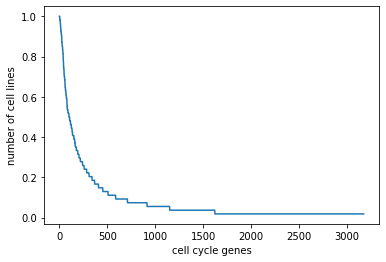

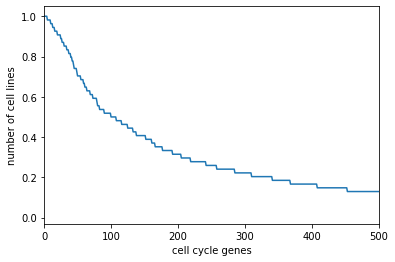

In [22]:
gmt_dict = {}
all_genes_counts = {}
gene_celllines = {}

with open("cell_cycle_genes_reactome_extended.txt", "r") as f:
    cell_cycle_genes_reactome = f.readlines()
cell_cycle_genes_reactome = [s[:-1] for s in cell_cycle_genes_reactome]

with open('cc_genes.gmt','r') as f:
    line = f.readline()[:-1]
    while line:
        parts = line.split('\t')
        gmt_dict[parts[0]]=parts[2:]
        line = f.readline()[:-1]
    
for key in gmt_dict:
    for g in gmt_dict[key]:
        if g in all_genes_counts:
            cnt = all_genes_counts[g]
            all_genes_counts[g] = cnt+1
            gene_celllines[g].append(key)
        else:
            all_genes_counts[g] = 1
            gene_celllines[g] = [key]

all_genes_counts = dict(sorted(all_genes_counts.items(), key=lambda item: item[1], reverse=True))            
            
counts = []
for key in all_genes_counts:
        is_cellcycle = key in cell_cycle_genes_reactome
        print(key+'\t'+str(all_genes_counts[key]/len(gmt_dict))+'\t'+str(is_cellcycle))
        counts.append(all_genes_counts[key]/len(gmt_dict))
plt.plot(counts)
plt.xlabel('cell cycle genes')
plt.ylabel('number of cell lines')
plt.show()

plt.plot(counts)
plt.xlim([0,500])
plt.xlabel('cell cycle genes')
plt.ylabel('number of cell lines')
plt.show()


#EwS_genes_counts = {}
#EwS_clns = ['CHLA9','CHLA10','TC71']
#EwS_clns = ['CHLA9','CHLA10']
#EwS_clns = ['Y79']
#for key in EwS_clns:
#    for g in gmt_dict[key]:
#        if g in EwS_genes_counts:
#            cnt = EwS_genes_counts[g]
#            EwS_genes_counts[g] = cnt+1
#        else:
#            EwS_genes_counts[g] = 1

#EwS_genes_counts = dict(sorted(EwS_genes_counts.items(), key=lambda item: item[1], reverse=True))            
#print(EwS_genes_counts)
#total_genes = []
#common_genes = gmt_dict[EwS_clns[0]]
#for cl in EwS_clns:
#    total_genes += gmt_dict[cl]
#total_genes = set(total_genes)
#print('Number of all EwS genes=',len(total_genes))
#for cl in EwS_clns[1:]:
#    common_genes = set(common_genes)&set(gmt_dict[cl])
#print('Number of common EwS genes=',len(common_EwS_genes))

#for g in common_EwS_genes:
#    print(g+'\t'+str(all_genes_counts[g])+'\t'+'\t'.join(gene_celllines[g]))

In [282]:
print(len(gmt_dict['Y79']))
for g in gmt_dict['Y79']:
    print(g+'\t'+str(all_genes_counts[g])+'\t'+'\t'.join(gene_celllines[g]))

126
HIST1H4C	40	42MGBA_CENTRAL_NERVOUS_SYSTEM	8305C_THYROID	93VU_UPPER_AERODIGESTIVE_TRACT	A375_SKIN	C32_SKIN	CHLA10	CHLA9	CL34_LARGE_INTESTINE	COLO680N_OESOPHAGUS	COLO741_SKIN	HEC59_ENDOMETRIUM	HELA_KO	HELA_WT	HMC18_BREAST	HT1080_SOFT_TISSUE	IALM_LUNG	IGR1_SKIN	IGR37_SKIN	JHU011_UPPER_AERODIGESTIVE_TRACT	JHU029_UPPER_AERODIGESTIVE_TRACT	LS180_LARGE_INTESTINE	NCIH1048_LUNG	NCIH1944_LUNG	NCIH2077_LUNG	NCIH2110_LUNG	NCIH2228_LUNG	NCIH2452_PLEURA	OVK18_OVARY	SCC25_UPPER_AERODIGESTIVE_TRACT	SCC47_UPPER_AERODIGESTIVE_TRACT	SCC9_UPPER_AERODIGESTIVE_TRACT	SKMEL30_SKIN	SNU738_CENTRAL_NERVOUS_SYSTEM	SNUC4_LARGE_INTESTINE	TC71	TE14_OESOPHAGUS	TE6_OESOPHAGUS	VMCUB1_URINARY_TRACT	Y79	YD38_UPPER_AERODIGESTIVE_TRACT
HMGB1	15	93VU_UPPER_AERODIGESTIVE_TRACT	A375_SKIN	C32_SKIN	COLO741_SKIN	HT1080_SOFT_TISSUE	JHU011_UPPER_AERODIGESTIVE_TRACT	JHU029_UPPER_AERODIGESTIVE_TRACT	LS180_LARGE_INTESTINE	NCIH460_LUNG	OVK18_OVARY	SCC25_UPPER_AERODIGESTIVE_TRACT	SCC9_UPPER_AERODIGESTIVE_TRACT	SKMEL30_SKIN	SNUC4_LA

In [ ]:
# Study effect of re-normalization

adata_k_before_renorm = sc.read_h5ad(folder+fname)
fig = plt.figure(figsize=(10,10))
center = np.array([1.0,1.35])
center1 = np.array([0.85,1.1])
plt.plot(adata_k.obs['S-phase'],adata_k.obs['G2-M'],'ko',alpha=0.1)
plt.plot(adata_k_before_renorm.obs['S-phase'],adata_k_before_renorm.obs['G2-M'],'ro',alpha=0.1)
for i in range(adata_k.X.shape[0]):
    x = np.array([adata_k.obs['S-phase'][i],adata_k.obs['G2-M'][i]])
    #print(np.linalg.norm(x-center))
    if np.linalg.norm(x-center)<0.15:
        plt.plot(adata_k.obs['S-phase'][i],adata_k.obs['G2-M'][i],'ko')
        plt.plot([adata_k.obs['S-phase'][i],adata_k_before_renorm.obs['S-phase'][i]],
                    [adata_k.obs['G2-M'][i],adata_k_before_renorm.obs['G2-M'][i]],'r-')
    if np.linalg.norm(x-center1)<0.15:
        plt.plot(adata_k.obs['S-phase'][i],adata_k.obs['G2-M'][i],'bo',alpha=0.1)
        plt.plot([adata_k.obs['S-phase'][i],adata_k_before_renorm.obs['S-phase'][i]],
                    [adata_k.obs['G2-M'][i],adata_k_before_renorm.obs['G2-M'][i]],'b-',alpha=0.3)
plt.show()


In [ ]:
cls = adata_k.obs['partition']
cls1 = np.zeros(adata_k.X.shape[0])
prt = adata_k.obs['partition']
n_nodes=np.max(adata_k.obs['partition'])
tc = adata_k.obs['total_counts_raw']
vrs = np.zeros(n_nodes)
for i in range(n_nodes):
    vrs[i] = np.var(tc[np.where(prt==i)[0]])
    cls1[np.where(prt==i)[0]] = vrs[i]
    #if vrs[i]>np.mean(vrs)+3*np.std(vrs):
    #    cls1[np.where(prt==i)[0]] = 1
cls1 = tc
cls1 = cls

fig = plt.figure(figsize=(10,10))
plt.scatter(adata_k_before_renorm.obs['S-phase'],adata_k_before_renorm.obs['G2-M'],c=cls1,alpha=1,s=100)
plt.show()
fig = plt.figure(figsize=(10,10))
plt.scatter(adata_k.obs['S-phase'],adata_k.obs['G2-M'],c=cls1,alpha=1,s=100)
plt.show()
plt.plot(vrs)
plt.plot([0,n_nodes],[np.median(vrs),np.median(vrs)],'r-')
plt.plot([0,n_nodes],[np.median(vrs)+2*np.std(vrs),np.median(vrs)+2*np.std(vrs)],'r--')
plt.show()

In [ ]:
from mpl_toolkits.mplot3d import Axes3D

ax_x = 'S-phase'
ax_y = 'G2-M'
ax_z = 'Histone_IC'
idx_x = cc_coords.index(ax_x)
idx_y = cc_coords.index(ax_y)
idx_z = cc_coords.index(ax_z)

fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(111, projection='3d')
ax.view_init(elev=30., azim=170)

ind_prolif = adata.obs['proliferating']
ind_prolif_not = ~adata.obs['proliferating']

ax.scatter(adata.obs[ax_x][ind_prolif],adata.obs[ax_y][ind_prolif],adata.obs[ax_z][ind_prolif],c=adata.obs['total_counts'][ind_prolif],alpha=0.2)
ax.scatter(adata.obs[ax_x][ind_prolif_not],adata.obs[ax_y][ind_prolif_not],adata.obs[ax_z][ind_prolif_not],c='grey',alpha=0.2)

for e in edges:
    ax.plot([nodep[e[0],idx_x],nodep[e[1],idx_x]],[nodep[e[0],idx_y],nodep[e[1],idx_y]],[nodep[e[0],idx_z],nodep[e[1],idx_z]],'r-',linewidth=10)



In [ ]:
# Animated 3D visualization

from mpl_toolkits.mplot3d import Axes3D

X_4IC = adata.obs[cc_coords].to_numpy().astype(np.float64)
pca = PCA()
u = pca.fit_transform(X_4IC)
v = pca.components_.T
mn = np.mean(X_4IC,axis=0)

nodep_pca = (nodep-mn)@v


azim_vals = range(0,360,5)

for i,azim in enumerate(azim_vals):
    
    fig = plt.figure(figsize=(10,10))
    ax = fig.add_subplot(111, projection='3d')

    ax.view_init(elev=50., azim=azim)
    #ax.view_init(elev=20., azim=210)

    ind_prolif = adata.obs['proliferating']
    ind_prolif_not = ~adata.obs['proliferating']

    ax.scatter(u[ind_prolif,0],u[ind_prolif,1],u[ind_prolif,2],c=adata.obs['total_counts'][ind_prolif],alpha=0.2)
    ax.scatter(u[ind_prolif_not,0],u[ind_prolif_not,1],u[ind_prolif_not,2],c='grey',alpha=0.2)

    for e in edges:
        ax.plot([nodep_pca[e[0],0],nodep_pca[e[1],0]],
                [nodep_pca[e[0],1],nodep_pca[e[1],1]],
                [nodep_pca[e[0],2],nodep_pca[e[1],2]],
                'r-',linewidth=10)

    plt.margins(tight=True)
    suff = str(i)
    if len(suff)==1:
        suff = '0'+suff
    
    plt.savefig('pca_traj'+suff+'.png',dpi=150,bbox_inches='tight')
    #fig.canvas.draw()
    #fig.canvas.flush_events()
    #plt.clf()

In [ ]:
# Interactive 3D visualization

import plotly.graph_objects as go
import numpy as np

#print(np.array([1.0]*len(u[ind_prolif,0])).shape)
#print(u[ind_prolif,0].shape)
#df = pd.DataFrame(data={'PC1':u[ind_prolif,0],'PC2':u[ind_prolif,1],'PC3':u[ind_prolif,2],
#                        'sz':np.array([1]*len(u[ind_prolif,0])),
#                       'total_counts':adata.obs['total_counts'][ind_prolif]})
#fig = px.scatter_3d(df,x='PC1',y='PC2',z='PC3',size='sz',size_max=10,
#                    color='total_counts',
#                       marker=dict(
#                    size=12,
#                    color=adata.obs['total_counts'][ind_prolif],               
#                    colorscale='Viridis',  
#                    opacity=0.8
#    ))
#fig.update_layout(margin=dict(l=0, r=0, b=0, t=0))
#fig.show()

data=[go.Scatter3d(
    x=u[ind_prolif,0],
    y=u[ind_prolif,1],
    z=u[ind_prolif,2],
    mode='markers',
    marker=dict(
        size=3,
        color=adata.obs['total_counts'][ind_prolif],                # set color to an array/list of desired values
        colorscale='Viridis',   # choose a colorscale
        opacity=0.3
    ),
    line = dict(width=5,color='red')
)]

data.append(go.Scatter3d(
    x=u[ind_prolif_not,0],
    y=u[ind_prolif_not,1],
    z=u[ind_prolif_not,2],
    mode='markers',
    marker=dict(
        size=3,
        color='grey',                # set color to an array/list of desired values
        opacity=0.7
    )
))

nodeseq = np.zeros((2*len(edges),3))
for i,e in enumerate(edges):
    nodeseq[0,0] = nodep_pca[e[0],0]
    nodeseq[1,0] = nodep_pca[e[1],0]
    nodeseq[0,1] = nodep_pca[e[0],1]
    nodeseq[1,1] = nodep_pca[e[1],1]
    nodeseq[0,2] = nodep_pca[e[0],2]
    nodeseq[1,2] = nodep_pca[e[1],2]
    data.append(go.Scatter3d(
        x=nodeseq[0:2,0],
        y=nodeseq[0:2,1],
        z=nodeseq[0:2,2],
        marker=dict(
            size=3,
            color='red',
        ),
           line=dict(
            color='red',
            width=30
        )
    ))
    

#data=app

    

fig = go.Figure(data)

# tight layout
fig.update_layout(margin=dict(l=0, r=0, b=0, t=0))
fig.show()